/Users/milliespencer/miniconda3/envs/glacier-env/lib/python3.10/site-packages/pyogrio/raw.py:198: RuntimeWarning: /Users/milliespencer/Downloads/Re_ Following up on our conversation at Western Snow - Rock glacier project incorporating ASO flights (1)/ASO_CO_20260519_targets/ASO_CO_20260519_targets.shp contains polygon(s) with rings with invalid winding order. Autocorrecting them, but that shapefile should be corrected using ogr2ogr for example.
  return ogr_read(


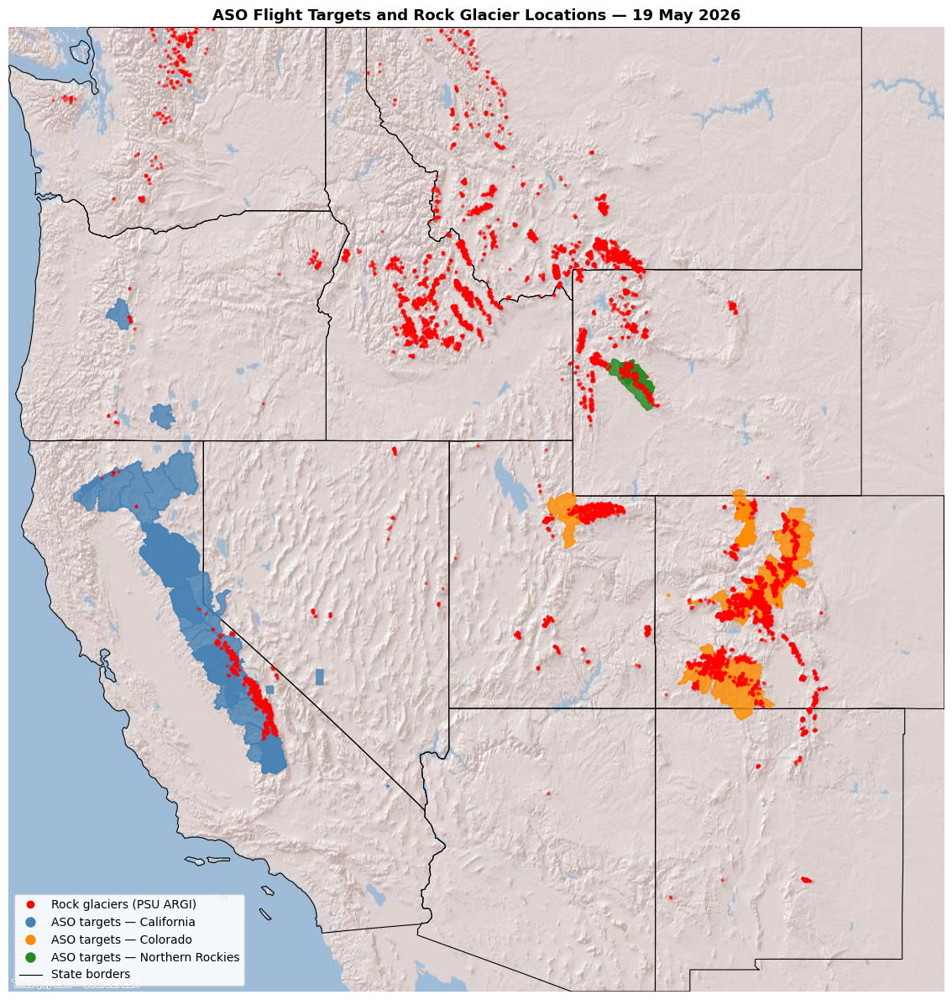

In [2]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.lines import Line2D
import requests
from io import BytesIO
import zipfile

# Load ASO and rock glacier shapefiles
base = '/Users/milliespencer/Downloads/Re_ Following up on our conversation at Western Snow - Rock glacier project incorporating ASO flights (1)'

gdf_ca = gpd.read_file(f'{base}/ASO_CA_20260519_targets/ASO_CA_20260519_targets.shp').to_crs('EPSG:3857')
gdf_co = gpd.read_file(f'{base}/ASO_CO_20260519_targets/ASO_CO_20260519_targets.shp').to_crs('EPSG:3857')
gdf_nr = gpd.read_file(f'{base}/ASO_NR_20260519_targets/ASO_NR_20260519_targets.shp').to_crs('EPSG:3857')
gdf_rg = gpd.read_file('/Users/milliespencer/Downloads/PSU_ARGI/PSU_ARGI.shp').to_crs('EPSG:3857')

# Load US state borders from Census Bureau
states_url = 'https://www2.census.gov/geo/tiger/GENZ2022/shp/cb_2022_us_state_20m.zip'
r = requests.get(states_url)
with zipfile.ZipFile(BytesIO(r.content)) as z:
    z.extractall('/tmp/us_states')
gdf_states = gpd.read_file('/tmp/us_states/cb_2022_us_state_20m.shp').to_crs('EPSG:3857')

# Clip to western US
western = ['CA', 'OR', 'WA', 'ID', 'MT', 'WY', 'CO', 'UT', 'NV', 'AZ', 'NM']
gdf_west = gdf_states[gdf_states['STUSPS'].isin(western)]

fig, ax = plt.subplots(figsize=(12, 12))

# State borders
gdf_west.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.8, zorder=2)

gdf_ca.plot(ax=ax, color='steelblue',   edgecolor='steelblue',   alpha=0.8, zorder=4)
gdf_co.plot(ax=ax, color='darkorange',  edgecolor='darkorange',  alpha=0.8, zorder=4)
gdf_nr.plot(ax=ax, color='forestgreen', edgecolor='forestgreen', alpha=0.8, zorder=4)

# Rock glaciers on top
gdf_rg.copy().assign(geometry=gdf_rg.centroid).plot(
    ax=ax, color='red', markersize=4, alpha=0.5, zorder=5)

ctx.add_basemap(ax, source=ctx.providers.Esri.WorldShadedRelief, zoom=6)

# Zoom to western US extent
minx, miny, maxx, maxy = gdf_west.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

legend_elements = [
    Line2D([0],[0], marker='o', color='w', markerfacecolor='red',
           markersize=8,  label='Rock glaciers (PSU ARGI)'),
    Line2D([0],[0], marker='o', color='w', markerfacecolor='steelblue',
           markersize=10, label='ASO targets — California'),
    Line2D([0],[0], marker='o', color='w', markerfacecolor='darkorange',
           markersize=10, label='ASO targets — Colorado'),
    Line2D([0],[0], marker='o', color='w', markerfacecolor='forestgreen',
           markersize=10, label='ASO targets — Northern Rockies'),
    Line2D([0],[0], color='black', linewidth=0.8,
           label='State borders'),
]
ax.legend(handles=legend_elements, fontsize=10, loc='lower left', framealpha=0.9)
ax.set_title('ASO Flight Targets and Rock Glacier Locations — 19 May 2026',
             fontsize=13, fontweight='bold')
ax.set_axis_off()
plt.tight_layout()
plt.savefig('ASO_rockglacier_targets_map.png', dpi=200, bbox_inches='tight')
plt.show()


Shape: (36, 9)

CRS:
EPSG:4326

Columns:
['label', 'path', 'direction', 'n_slc', 'span_years', 'cov_frac', 'first_acq', 'last_acq', 'geometry']

Geometry types:
Polygon    36
Name: count, dtype: int64

Bounds:
[-123.11234896   35.44655154 -103.00946006   50.44056061]

First 5 rows:


,label,path,direction,n_slc,span_years,cov_frac,first_acq,last_acq,geometry
0,A_p64,64,ASCENDING,317,11.79,11.1458,2014-11-03,2026-08-21,"POLYGON ((-119.39105 36.39655, -119.78466 38.0..."
1,D_p144,144,DESCENDING,435,11.79,11.1654,2014-11-08,2026-08-26,"POLYGON ((-120.29334 38.71676, -117.41263 38.3..."
2,A_p64_2,64,ASCENDING,272,11.79,19.6275,2014-11-03,2026-08-21,"POLYGON ((-119.50731 36.89552, -119.90348 38.5..."
3,A_p64_3,64,ASCENDING,316,11.73,31.4600,2014-11-03,2026-07-28,"POLYGON ((-122.66345 48.55426, -119.20682 48.9..."
4,D_p115,115,DESCENDING,315,11.63,30.1286,2014-11-06,2026-06-24,"POLYGON ((-119.80259 47.45024, -122.46045 47.7..."


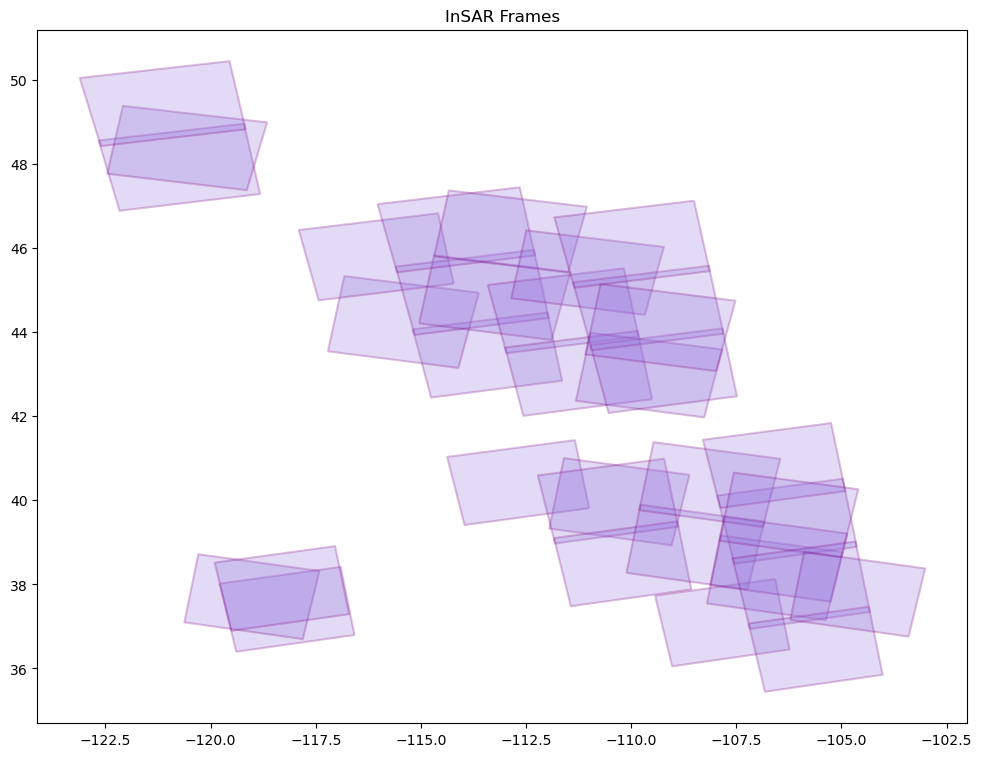

In [4]:
# ================================================================
# LOAD AND INSPECT INSAR FRAMES
# ================================================================

import geopandas as gpd
import matplotlib.pyplot as plt

INSAR_PATH = (
    '/Users/milliespencer/Desktop/JobApps2026/'
    'NSF2026 dan rock glaciers/frames/frames.shp'
)

gdf_insar = gpd.read_file(INSAR_PATH)

print('Shape:', gdf_insar.shape)

print('\nCRS:')
print(gdf_insar.crs)

print('\nColumns:')
print(gdf_insar.columns.tolist())

print('\nGeometry types:')
print(gdf_insar.geometry.geom_type.value_counts())

print('\nBounds:')
print(gdf_insar.total_bounds)

print('\nFirst 5 rows:')
display(gdf_insar.head())

# ------------------------------------------------
# Plot
# ------------------------------------------------

fig, ax = plt.subplots(figsize=(12, 10))

gdf_insar.plot(
    ax=ax,
    facecolor='mediumpurple',
    edgecolor='purple',
    alpha=0.25,
    linewidth=1.5
)

ax.set_aspect('equal')
ax.set_title('InSAR Frames')
plt.show()

/Users/milliespencer/miniconda3/envs/glacier-env/lib/python3.10/site-packages/pyogrio/raw.py:198: RuntimeWarning: /Users/milliespencer/Downloads/Re_ Following up on our conversation at Western Snow - Rock glacier project incorporating ASO flights (1)/ASO_CO_20260519_targets/ASO_CO_20260519_targets.shp contains polygon(s) with rings with invalid winding order. Autocorrecting them, but that shapefile should be corrected using ogr2ogr for example.
  return ogr_read(


ASO California: 44
ASO Colorado: 39
ASO Northern Rockies: 4
Rock glaciers: 10332
InSAR frames: 36

InSAR frames by direction:
direction
ASCENDING     21
DESCENDING    15
Name: count, dtype: int64


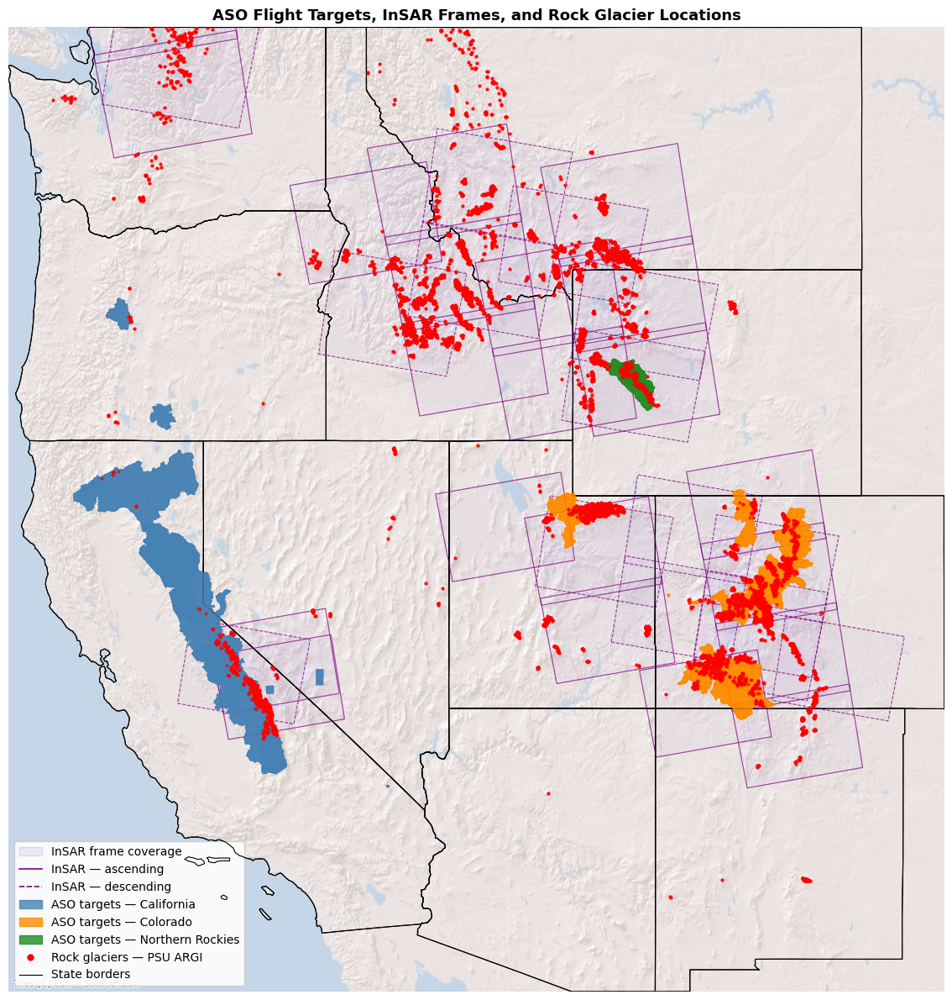

In [5]:
# ================================================================
# ASO + INSAR FRAMES + ROCK GLACIERS
# ================================================================

import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

# ================================================================
# PATHS
# ================================================================

base = (
    '/Users/milliespencer/Downloads/'
    'Re_ Following up on our conversation at Western Snow - '
    'Rock glacier project incorporating ASO flights (1)'
)

ASO_CA = f'{base}/ASO_CA_20260519_targets/ASO_CA_20260519_targets.shp'
ASO_CO = f'{base}/ASO_CO_20260519_targets/ASO_CO_20260519_targets.shp'
ASO_NR = f'{base}/ASO_NR_20260519_targets/ASO_NR_20260519_targets.shp'

RG_PATH = '/Users/milliespencer/Downloads/PSU_ARGI/PSU_ARGI.shp'

INSAR_PATH = (
    '/Users/milliespencer/Desktop/JobApps2026/'
    'NSF2026 dan rock glaciers/frames/frames.shp'
)

# ================================================================
# LOAD DATA
# ================================================================

gdf_ca = gpd.read_file(ASO_CA).to_crs('EPSG:3857')
gdf_co = gpd.read_file(ASO_CO).to_crs('EPSG:3857')
gdf_nr = gpd.read_file(ASO_NR).to_crs('EPSG:3857')

gdf_rg = gpd.read_file(RG_PATH).to_crs('EPSG:3857')

gdf_insar = gpd.read_file(INSAR_PATH).to_crs('EPSG:3857')

print('ASO California:', len(gdf_ca))
print('ASO Colorado:', len(gdf_co))
print('ASO Northern Rockies:', len(gdf_nr))
print('Rock glaciers:', len(gdf_rg))
print('InSAR frames:', len(gdf_insar))

# ================================================================
# LOAD WESTERN US STATE BORDERS
# ================================================================

import requests
from io import BytesIO
import zipfile

states_url = (
    'https://www2.census.gov/geo/tiger/GENZ2022/shp/'
    'cb_2022_us_state_20m.zip'
)

r = requests.get(states_url)

with zipfile.ZipFile(BytesIO(r.content)) as z:
    z.extractall('/tmp/us_states')

gdf_states = gpd.read_file(
    '/tmp/us_states/cb_2022_us_state_20m.shp'
).to_crs('EPSG:3857')

western = [
    'CA', 'OR', 'WA', 'ID', 'MT',
    'WY', 'CO', 'UT', 'NV', 'AZ', 'NM'
]

gdf_west = gdf_states[
    gdf_states['STUSPS'].isin(western)
]

# ================================================================
# SEPARATE INSAR BY ORBIT DIRECTION
# ================================================================

gdf_insar_asc = gdf_insar[
    gdf_insar['direction'].str.upper() == 'ASCENDING'
]

gdf_insar_desc = gdf_insar[
    gdf_insar['direction'].str.upper() == 'DESCENDING'
]

print('\nInSAR frames by direction:')
print(gdf_insar['direction'].value_counts())

# ================================================================
# ROCK GLACIER CENTROIDS
# ================================================================

gdf_rg_points = gdf_rg.copy()
gdf_rg_points['geometry'] = gdf_rg_points.geometry.centroid

# ================================================================
# FIGURE
# ================================================================

fig, ax = plt.subplots(figsize=(12, 12))

# ------------------------------------------------
# 1. STATE BORDERS
# ------------------------------------------------

gdf_west.plot(
    ax=ax,
    facecolor='none',
    edgecolor='black',
    linewidth=0.8,
    zorder=1
)

# ------------------------------------------------
# 2. INSAR FRAME COVERAGE
# ------------------------------------------------
# Very subtle fill, with orbit direction shown
# through line style.

gdf_insar.plot(
    ax=ax,
    facecolor='mediumpurple',
    edgecolor='none',
    alpha=0.04,
    zorder=2
)

gdf_insar_asc.plot(
    ax=ax,
    facecolor='none',
    edgecolor='purple',
    linewidth=0.8,
    alpha=0.45,
    linestyle='-',
    zorder=3
)

gdf_insar_desc.plot(
    ax=ax,
    facecolor='none',
    edgecolor='purple',
    linewidth=0.8,
    alpha=0.45,
    linestyle='--',
    zorder=3
)

# ------------------------------------------------
# 3. ASO TARGETS
# ------------------------------------------------

gdf_ca.plot(
    ax=ax,
    color='steelblue',
    edgecolor='steelblue',
    alpha=0.80,
    linewidth=0.8,
    zorder=5
)

gdf_co.plot(
    ax=ax,
    color='darkorange',
    edgecolor='darkorange',
    alpha=0.80,
    linewidth=0.8,
    zorder=5
)

gdf_nr.plot(
    ax=ax,
    color='forestgreen',
    edgecolor='forestgreen',
    alpha=0.80,
    linewidth=0.8,
    zorder=5
)

# ------------------------------------------------
# 4. ROCK GLACIERS
# ------------------------------------------------

gdf_rg_points.plot(
    ax=ax,
    color='red',
    markersize=4,
    alpha=0.60,
    zorder=6
)

# ------------------------------------------------
# 5. BASEMAP
# ------------------------------------------------

ctx.add_basemap(
    ax,
    source=ctx.providers.Esri.WorldShadedRelief,
    zoom=6,
    alpha=0.60
)

# ------------------------------------------------
# 6. REDRAW DATA ABOVE BASEMAP
# ------------------------------------------------

gdf_west.plot(
    ax=ax,
    facecolor='none',
    edgecolor='black',
    linewidth=0.8,
    zorder=10
)

gdf_insar_asc.plot(
    ax=ax,
    facecolor='none',
    edgecolor='purple',
    linewidth=0.8,
    alpha=0.45,
    linestyle='-',
    zorder=11
)

gdf_insar_desc.plot(
    ax=ax,
    facecolor='none',
    edgecolor='purple',
    linewidth=0.8,
    alpha=0.45,
    linestyle='--',
    zorder=11
)

gdf_ca.plot(
    ax=ax,
    color='steelblue',
    edgecolor='steelblue',
    alpha=0.80,
    linewidth=0.8,
    zorder=12
)

gdf_co.plot(
    ax=ax,
    color='darkorange',
    edgecolor='darkorange',
    alpha=0.80,
    linewidth=0.8,
    zorder=12
)

gdf_nr.plot(
    ax=ax,
    color='forestgreen',
    edgecolor='forestgreen',
    alpha=0.80,
    linewidth=0.8,
    zorder=12
)

gdf_rg_points.plot(
    ax=ax,
    color='red',
    markersize=4,
    alpha=0.60,
    zorder=13
)

# ================================================================
# EXTENT
# ================================================================

minx, miny, maxx, maxy = gdf_west.total_bounds

ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# ================================================================
# LEGEND
# ================================================================

legend_elements = [

    # InSAR
    Patch(
        facecolor='mediumpurple',
        edgecolor='purple',
        alpha=0.12,
        label='InSAR frame coverage'
    ),

    Line2D(
        [0], [0],
        color='purple',
        linewidth=1.2,
        linestyle='-',
        label='InSAR — ascending'
    ),

    Line2D(
        [0], [0],
        color='purple',
        linewidth=1.2,
        linestyle='--',
        label='InSAR — descending'
    ),

    # ASO
    Patch(
        facecolor='steelblue',
        edgecolor='steelblue',
        alpha=0.80,
        label='ASO targets — California'
    ),

    Patch(
        facecolor='darkorange',
        edgecolor='darkorange',
        alpha=0.80,
        label='ASO targets — Colorado'
    ),

    Patch(
        facecolor='forestgreen',
        edgecolor='forestgreen',
        alpha=0.80,
        label='ASO targets — Northern Rockies'
    ),

    # Rock glaciers
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        markerfacecolor='red',
        markersize=7,
        label='Rock glaciers — PSU ARGI'
    ),

    # State borders
    Line2D(
        [0], [0],
        color='black',
        linewidth=0.8,
        label='State borders'
    ),
]

ax.legend(
    handles=legend_elements,
    fontsize=10,
    loc='lower left',
    framealpha=0.9
)

# ================================================================
# TITLE
# ================================================================

ax.set_title(
    'ASO Flight Targets, InSAR Frames, and Rock Glacier Locations',
    fontsize=13,
    fontweight='bold'
)

ax.set_axis_off()

plt.tight_layout()

plt.savefig(
    'ASO_InSAR_rockglacier_targets_map.png',
    dpi=300,
    bbox_inches='tight'
)

plt.show()

In [11]:
# ================================================================
# LOAD DEMs, ORTHOS, AND ROCK GLACIER BUFFER GROUPS
# ================================================================

import os
import glob
import rasterio
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ------------------------------------------------
# DATA PATHS
# ------------------------------------------------

BASE = (
    '/Users/milliespencer/Desktop/JobApps2026/'
    'NSF2026 dan rock glaciers/DEM_and_Ortho_final_versions'
)

DEM_FOLDER = os.path.join(BASE, 'New DEMs from Ash')

ORTHO_FOLDER = os.path.join(BASE, 'Orthos_Case_Knuth_2024')

RG_BUFFER_PATH = (
    '/Users/milliespencer/Desktop/JobApps2026/'
    'NSF2026 dan rock glaciers/glaciers_buffered_merged/'
    'buffered_merged.shp'
)

# ------------------------------------------------
# FIND RASTERS
# ------------------------------------------------

dem_files = sorted(glob.glob(os.path.join(DEM_FOLDER, '*.tif')))
ortho_files = sorted(glob.glob(os.path.join(ORTHO_FOLDER, '*.tif')))

print(f'Found {len(dem_files)} DEM rasters:')
for f in dem_files:
    print('  ', os.path.basename(f))

print(f'\nFound {len(ortho_files)} ortho rasters:')
for f in ortho_files:
    print('  ', os.path.basename(f))

# ------------------------------------------------
# LOAD BUFFERED ROCK GLACIER GROUPS
# ------------------------------------------------

gdf_rg_buffer = gpd.read_file(RG_BUFFER_PATH)

print('\nBuffered rock-glacier groups:')
print(f'  Number of polygons: {len(gdf_rg_buffer)}')
print(f'  CRS: {gdf_rg_buffer.crs}')

# Reproject to DEM/ortho CRS
gdf_rg_buffer = gdf_rg_buffer.to_crs('EPSG:32612')

print(f'  Reprojected CRS: {gdf_rg_buffer.crs}')

Found 4 DEM rasters:
   1983-09-05_2_re-coregistered_USGS_DEM_2014_nuth_x-1.38_y+4.16_z+1.37_align.tif
   1989-08-30_3_re-coregistered_USGS_DEM_2014_nuth_x+0.76_y-0.60_z+3.22_align.tif
   1994-08-25_2_re-coregistered_USGS_DEM_2014_nuth_x-0.58_y+0.18_z+1.96_align.tif
   2001-08-25_2_re-coregistered_USGS_DEM_2014_nuth_x-0.40_y+2.46_z+1.16_align.tif

Found 14 ortho rasters:
   1967-08-03_ortho.tif
   1979-09-12_sub_cluster_0_ortho.tif
   1979-09-12_sub_cluster_1_ortho.tif
   1979-09-12_sub_cluster_2_ortho.tif
   1983-09-05_ortho.tif
   1983-09-10_ortho.tif
   1983-09-16_sub_cluster_0_ortho.tif
   1983-09-16_sub_cluster_1_ortho.tif
   1989-08-06_ortho.tif
   1989-08-30_ortho.tif
   1989-09-01_ortho.tif
   1989-09-03_ortho.tif
   2001-08-25_ortho.tif
   2002-08-18_ortho.tif

Buffered rock-glacier groups:
  Number of polygons: 228
  CRS: EPSG:5070
  Reprojected CRS: EPSG:32612


Individual rock glaciers intersecting raster extent: 87
Buffered groups intersecting raster extent: 2


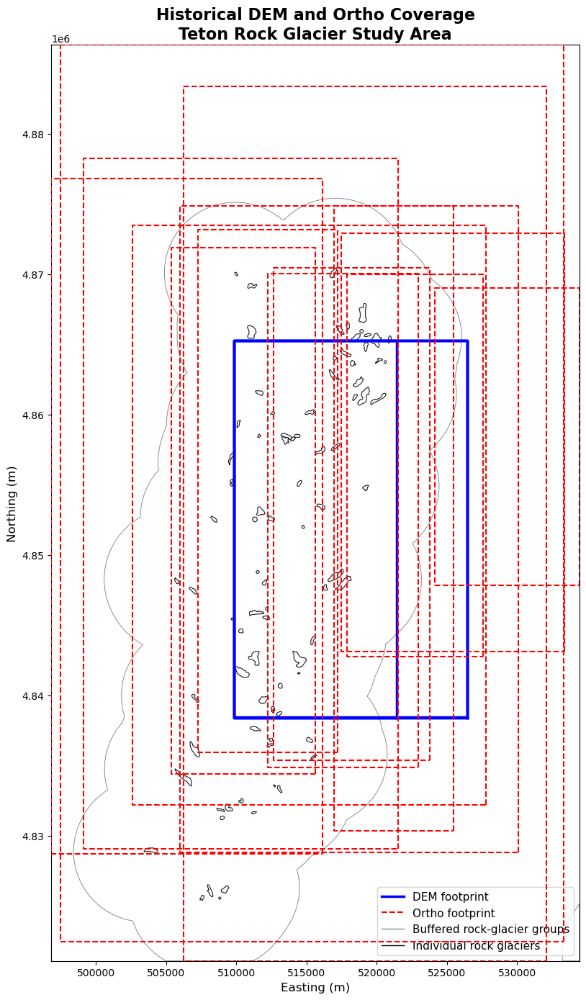

In [18]:
# ================================================================
# PLOT HISTORICAL RASTER COVERAGE + ROCK GLACIERS
# NO BASEMAP
# ================================================================

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from shapely.geometry import box
from shapely.ops import unary_union

# ------------------------------------------------
# MAKE SURE EVERYTHING IS EPSG:32612
# ------------------------------------------------

gdf_rg = gpd.read_file(PSU_RG_PATH).to_crs('EPSG:32612')
gdf_rg_buffer = gpd.read_file(RG_BUFFER_PATH).to_crs('EPSG:32612')

# ------------------------------------------------
# DEM FOOTPRINTS
# ------------------------------------------------

dem_records = []

for f in dem_files:

    with rasterio.open(f) as src:

        b = src.bounds

        dem_records.append({
            'filename': os.path.basename(f),
            'date': os.path.basename(f)[:10],
            'resolution': src.res[0],
            'geometry': box(
                b.left,
                b.bottom,
                b.right,
                b.top
            )
        })

gdf_dem = gpd.GeoDataFrame(
    dem_records,
    geometry='geometry',
    crs='EPSG:32612'
)

# ------------------------------------------------
# ORTHO FOOTPRINTS
# ------------------------------------------------

ortho_records = []

for f in ortho_files:

    with rasterio.open(f) as src:

        b = src.bounds

        ortho_records.append({
            'filename': os.path.basename(f),
            'date': os.path.basename(f)[:10],
            'resolution': src.res[0],
            'geometry': box(
                b.left,
                b.bottom,
                b.right,
                b.top
            )
        })

gdf_ortho = gpd.GeoDataFrame(
    ortho_records,
    geometry='geometry',
    crs='EPSG:32612'
)

# ------------------------------------------------
# COMBINED RASTER EXTENT
# ------------------------------------------------

all_raster_union = unary_union(
    list(gdf_dem.geometry) +
    list(gdf_ortho.geometry)
)

minx, miny, maxx, maxy = all_raster_union.bounds

raster_extent = box(
    minx,
    miny,
    maxx,
    maxy
)

# ------------------------------------------------
# CLIP ROCK GLACIERS TO RASTER EXTENT
# ------------------------------------------------

extent_gdf = gpd.GeoDataFrame(
    geometry=[raster_extent],
    crs='EPSG:32612'
)

gdf_rg_plot = gpd.clip(
    gdf_rg,
    extent_gdf
)

gdf_rg_buffer_plot = gpd.clip(
    gdf_rg_buffer,
    extent_gdf
)

print(f'Individual rock glaciers intersecting raster extent: '
      f'{len(gdf_rg_plot)}')

print(f'Buffered groups intersecting raster extent: '
      f'{len(gdf_rg_buffer_plot)}')

# ------------------------------------------------
# PLOT
# ------------------------------------------------

fig, ax = plt.subplots(figsize=(15, 14))

# ------------------------------------------------
# BUFFERED ROCK GLACIER GROUPS
# ------------------------------------------------

gdf_rg_buffer_plot.boundary.plot(
    ax=ax,
    color='black',
    linewidth=0.7,
    alpha=0.45,
    zorder=1
)

# ------------------------------------------------
# INDIVIDUAL ROCK GLACIER POLYGONS
# ------------------------------------------------

gdf_rg_plot.plot(
    ax=ax,
    facecolor='none',
    edgecolor='black',
    linewidth=0.8,
    alpha=0.9,
    zorder=3
)

# ------------------------------------------------
# DEM FOOTPRINTS
# ------------------------------------------------

for _, row in gdf_dem.iterrows():

    x, y = row.geometry.exterior.xy

    ax.plot(
        x,
        y,
        color='blue',
        linewidth=2.5,
        linestyle='-',
        zorder=5
    )

# ------------------------------------------------
# ORTHO FOOTPRINTS
# ------------------------------------------------

for _, row in gdf_ortho.iterrows():

    x, y = row.geometry.exterior.xy

    ax.plot(
        x,
        y,
        color='red',
        linewidth=1.5,
        linestyle='--',
        zorder=6
    )

# ------------------------------------------------
# SET VIEW TO RASTER EXTENT
# ------------------------------------------------

ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# ------------------------------------------------
# LEGEND
# ------------------------------------------------

legend_elements = [
    Line2D(
        [0], [0],
        color='blue',
        linewidth=2.5,
        linestyle='-',
        label='DEM footprint'
    ),
    Line2D(
        [0], [0],
        color='red',
        linewidth=1.5,
        linestyle='--',
        label='Ortho footprint'
    ),
    Line2D(
        [0], [0],
        color='black',
        linewidth=1,
        linestyle='-',
        alpha=0.45,
        label='Buffered rock-glacier groups'
    ),
    Line2D(
        [0], [0],
        color='black',
        linewidth=1,
        linestyle='-',
        label='Individual rock glaciers'
    )
]

ax.legend(
    handles=legend_elements,
    loc='lower right',
    fontsize=11,
    frameon=True
)

# ------------------------------------------------
# TITLE
# ------------------------------------------------

ax.set_title(
    'Historical DEM and Ortho Coverage\n'
    'Teton Rock Glacier Study Area',
    fontsize=16,
    fontweight='bold'
)

ax.set_xlabel('Easting (m)', fontsize=12)
ax.set_ylabel('Northing (m)', fontsize=12)

ax.set_aspect('equal')

plt.tight_layout()
plt.show()

In [19]:
# ================================================================
# HISTORICAL ROCK GLACIER IMCORR PREPROCESSING
#
# Creates:
#
# 1. TRUE 500 m buffers around individual PSU rock glaciers
#
# 2. FULL DEM DATASET
#       1983 + 1989 + 1994 + 2001
#       common resolution = 12.6 m
#
# 3. HIGH-RES DEM DATASET
#       1983 + 1994 + 2001
#       common resolution = 8.7 m
#
# 4. Hillshades generated AFTER DEM resampling
#
# 5. Orthos aligned to common 5.682435 m grid
#
# 6. Each raster clipped to the 500 m buffers around
#    PSU glaciers intersecting that raster
#
# IMPORTANT:
# - Never upsample to a finer native resolution
# - Product types remain separate
# - DEM -> DEM
# - Hillshade -> Hillshade
# - Ortho -> Ortho
# - Original input files are NOT modified
# ================================================================


import os
import glob
import numpy as np
import geopandas as gpd
import rasterio

from rasterio.enums import Resampling
from rasterio.transform import from_origin
from rasterio.warp import reproject
from rasterio.mask import mask

from shapely.geometry import box
from shapely.ops import unary_union


# ================================================================
# 1. PATHS
# ================================================================

BASE = (
    '/Users/milliespencer/Desktop/JobApps2026/'
    'NSF2026 dan rock glaciers/DEM_and_Ortho_final_versions'
)

DEM_FOLDER = os.path.join(
    BASE,
    'New DEMs from Ash'
)

ORTHO_FOLDER = os.path.join(
    BASE,
    'Orthos_Case_Knuth_2024'
)

PSU_RG_PATH = (
    '/Users/milliespencer/Downloads/PSU_ARGI/PSU_ARGI.shp'
)

OUT_BASE = os.path.join(
    BASE,
    'IMCORR_preprocessed_500m'
)


# ================================================================
# OUTPUT DIRECTORIES
# ================================================================

DEM_FULL_OUT = os.path.join(
    OUT_BASE,
    'DEMs',
    'full_12p6m'
)

DEM_HIGH_OUT = os.path.join(
    OUT_BASE,
    'DEMs',
    'highres_8p7m'
)

HS_FULL_OUT = os.path.join(
    OUT_BASE,
    'Hillshades',
    'full_12p6m'
)

HS_HIGH_OUT = os.path.join(
    OUT_BASE,
    'Hillshades',
    'highres_8p7m'
)

ORTHO_OUT = os.path.join(
    OUT_BASE,
    'Orthos',
    '5p682m'
)

BUFFER_OUT = os.path.join(
    OUT_BASE,
    'PSU_500m_buffers'
)

CLIPPED_OUT = os.path.join(
    OUT_BASE,
    'clipped_500m'
)

for folder in [
    DEM_FULL_OUT,
    DEM_HIGH_OUT,
    HS_FULL_OUT,
    HS_HIGH_OUT,
    ORTHO_OUT,
    BUFFER_OUT,
    CLIPPED_OUT
]:
    os.makedirs(folder, exist_ok=True)


# ================================================================
# 2. LOAD INPUT FILES
# ================================================================

dem_files = sorted(
    glob.glob(
        os.path.join(DEM_FOLDER, '*.tif')
    )
)

ortho_files = sorted(
    glob.glob(
        os.path.join(ORTHO_FOLDER, '*.tif')
    )
)

print('=' * 70)
print('INPUT DATA')
print('=' * 70)

print(f'\nDEMs found: {len(dem_files)}')
for f in dem_files:
    print('  ', os.path.basename(f))

print(f'\nOrthos found: {len(ortho_files)}')
for f in ortho_files:
    print('  ', os.path.basename(f))


# ================================================================
# 3. LOAD PSU ROCK GLACIERS
# ================================================================

gdf_rg = gpd.read_file(
    PSU_RG_PATH
).to_crs('EPSG:32612')

print('\nPSU rock glaciers:', len(gdf_rg))
print('CRS:', gdf_rg.crs)


# ================================================================
# 4. MAKE TRUE 500 m BUFFER AROUND EACH INDIVIDUAL GLACIER
#
# Do NOT use the old buffered_merged.shp.
# ================================================================

BUFFER_DISTANCE = 500.0

gdf_rg_buffer = gdf_rg.copy()

gdf_rg_buffer['geometry'] = (
    gdf_rg_buffer.geometry.buffer(
        BUFFER_DISTANCE
    )
)

buffer_path = os.path.join(
    BUFFER_OUT,
    'PSU_ARGI_500m_buffers.shp'
)

gdf_rg_buffer.to_file(
    buffer_path
)

print('\n' + '=' * 70)
print('500 m BUFFER')
print('=' * 70)

print('Individual glaciers buffered:', len(gdf_rg_buffer))
print('Saved:')
print(buffer_path)


# ================================================================
# 5. INVENTORY DEM RESOLUTIONS
# ================================================================

dem_info = {}

for f in dem_files:

    with rasterio.open(f) as src:

        date = os.path.basename(f)[:10]

        dem_info[date] = {
            'path': f,
            'resolution': src.res[0],
            'bounds': src.bounds,
            'crs': src.crs
        }

print('\n' + '=' * 70)
print('DEM RESOLUTIONS')
print('=' * 70)

for date, info in dem_info.items():

    print(
        f"{date}: "
        f"{info['resolution']:.6f} m"
    )


# ================================================================
# 6. DEFINE THE TWO DEM DATASETS
# ================================================================

# FULL:
# all four dates
full_dates = [
    '1983-09-05',
    '1989-08-30',
    '1994-08-25',
    '2001-08-25'
]

# HIGH RES:
# exclude 1989 because its native resolution is 12.6 m
highres_dates = [
    '1983-09-05',
    '1994-08-25',
    '2001-08-25'
]

# Coarsest native resolution within each dataset
FULL_RES = 12.6
HIGH_RES = 8.7

print('\n' + '=' * 70)
print('DEM DATASETS')
print('=' * 70)

print(
    '\nFULL DATASET:',
    full_dates,
    f'\nCommon resolution: {FULL_RES} m'
)

print(
    '\nHIGH-RES DATASET:',
    highres_dates,
    f'\nCommon resolution: {HIGH_RES} m'
)


# ================================================================
# 7. FUNCTION TO GET COMMON EXTENT
# ================================================================

def get_union_bounds(files):

    geometries = []

    for f in files:

        with rasterio.open(f) as src:

            geometries.append(
                box(
                    src.bounds.left,
                    src.bounds.bottom,
                    src.bounds.right,
                    src.bounds.top
                )
            )

    union = unary_union(
        geometries
    )

    return union.bounds


# ================================================================
# 8. FUNCTION TO MAKE COMMON GRID
# ================================================================

def make_common_grid(
    bounds,
    resolution
):

    minx, miny, maxx, maxy = bounds

    # Snap the origin to the requested resolution.
    origin_x = (
        np.floor(
            minx / resolution
        ) * resolution
    )

    origin_y = (
        np.ceil(
            maxy / resolution
        ) * resolution
    )

    width = int(
        np.ceil(
            (maxx - origin_x)
            / resolution
        )
    )

    height = int(
        np.ceil(
            (origin_y - miny)
            / resolution
        )
    )

    transform = from_origin(
        origin_x,
        origin_y,
        resolution,
        resolution
    )

    return (
        transform,
        width,
        height
    )


# ================================================================
# 9. RESAMPLING FUNCTION
# ================================================================

def resample_to_grid(
    input_path,
    output_path,
    transform,
    width,
    height,
    dst_crs='EPSG:32612',
    resampling_method=Resampling.bilinear,
    dst_nodata=-9999.0
):

    with rasterio.open(
        input_path
    ) as src:

        destination = np.full(
            (height, width),
            dst_nodata,
            dtype=np.float32
        )

        reproject(
            source=rasterio.band(
                src,
                1
            ),
            destination=destination,
            src_transform=src.transform,
            src_crs=src.crs,
            src_nodata=src.nodata,
            dst_transform=transform,
            dst_crs=dst_crs,
            dst_nodata=dst_nodata,
            resampling=resampling_method
        )

        profile = src.profile.copy()

        profile.update(
            driver='GTiff',
            height=height,
            width=width,
            transform=transform,
            crs=dst_crs,
            count=1,
            dtype='float32',
            nodata=dst_nodata,
            compress='deflate',
            predictor=2,
            tiled=True
        )

        with rasterio.open(
            output_path,
            'w',
            **profile
        ) as dst:

            dst.write(
                destination,
                1
            )


# ================================================================
# 10. RESAMPLE A DEM DATASET
# ================================================================

def process_dem_dataset(
    dates,
    resolution,
    output_folder,
    dataset_name
):

    print('\n')
    print('=' * 70)
    print(f'PROCESSING DEM DATASET: {dataset_name}')
    print('=' * 70)

    files = [
        dem_info[d]['path']
        for d in dates
    ]

    common_bounds = get_union_bounds(
        files
    )

    transform, width, height = (
        make_common_grid(
            common_bounds,
            resolution
        )
    )

    print('\nCommon grid:')
    print('  Resolution:', resolution, 'm')
    print('  Width:', width)
    print('  Height:', height)
    print('  Bounds:', common_bounds)

    output_files = []

    for date in dates:

        input_path = dem_info[date]['path']

        base_name = os.path.basename(
            input_path
        )

        output_name = (
            os.path.splitext(base_name)[0]
            + f'_{dataset_name}_aligned.tif'
        )

        output_path = os.path.join(
            output_folder,
            output_name
        )

        print(
            f'\nResampling {date}...'
        )

        resample_to_grid(
            input_path=input_path,
            output_path=output_path,
            transform=transform,
            width=width,
            height=height,
            resampling_method=Resampling.bilinear,
            dst_nodata=-9999.0
        )

        output_files.append(
            output_path
        )

        print(
            'Saved:',
            output_path
        )

    return output_files


# ================================================================
# 11. PROCESS FULL DEM DATASET
# ================================================================

full_dem_files = process_dem_dataset(
    dates=full_dates,
    resolution=FULL_RES,
    output_folder=DEM_FULL_OUT,
    dataset_name='full_12p6m'
)


# ================================================================
# 12. PROCESS HIGH-RES DEM DATASET
# ================================================================

highres_dem_files = process_dem_dataset(
    dates=highres_dates,
    resolution=HIGH_RES,
    output_folder=DEM_HIGH_OUT,
    dataset_name='highres_8p7m'
)


# ================================================================
# 13. HILLSHADE FUNCTION
# ================================================================

def generate_hillshade(
    dem_path,
    output_path,
    azimuth=315.0,
    altitude=45.0
):

    with rasterio.open(
        dem_path
    ) as src:

        dem = src.read(
            1
        ).astype(
            np.float32
        )

        nodata = src.nodata

        if nodata is not None:

            valid = (
                dem != nodata
            )

        else:

            valid = np.isfinite(
                dem
            )

        dem[~valid] = np.nan

        xres = src.transform.a
        yres = abs(
            src.transform.e
        )

        # Elevation gradients
        dz_dy, dz_dx = np.gradient(
            dem,
            yres,
            xres
        )

        slope = np.arctan(
            np.sqrt(
                dz_dx**2 +
                dz_dy**2
            )
        )

        aspect = np.arctan2(
            -dz_dx,
            dz_dy
        )

        azimuth_rad = np.deg2rad(
            360.0 - azimuth + 90.0
        )

        altitude_rad = np.deg2rad(
            altitude
        )

        hillshade = (
            np.sin(altitude_rad)
            * np.cos(slope)
            +
            np.cos(altitude_rad)
            * np.sin(slope)
            * np.cos(
                azimuth_rad - aspect
            )
        )

        hillshade *= 255.0

        hillshade = np.clip(
            hillshade,
            0,
            255
        )

        hillshade[~valid] = -9999.0

        profile = src.profile.copy()

        profile.update(
            dtype='float32',
            nodata=-9999.0,
            count=1,
            compress='deflate',
            predictor=2,
            tiled=True
        )

        with rasterio.open(
            output_path,
            'w',
            **profile
        ) as dst:

            dst.write(
                hillshade.astype(
                    np.float32
                ),
                1
            )


# ================================================================
# 14. GENERATE HILLSHADES
#
# Hillshades are generated FROM the final resampled DEMs.
# Same illumination parameters for every date.
# ================================================================

def process_hillshades(
    dem_files,
    output_folder,
    dataset_name
):

    print('\n')
    print('=' * 70)
    print(f'GENERATING HILLSHADES: {dataset_name}')
    print('=' * 70)

    output_files = []

    for dem_path in dem_files:

        base_name = os.path.basename(
            dem_path
        )

        output_name = (
            os.path.splitext(base_name)[0]
            .replace(
                '_aligned',
                ''
            )
            + '_hillshade.tif'
        )

        output_path = os.path.join(
            output_folder,
            output_name
        )

        print(
            '\nGenerating:',
            output_name
        )

        generate_hillshade(
            dem_path=dem_path,
            output_path=output_path,
            azimuth=315.0,
            altitude=45.0
        )

        output_files.append(
            output_path
        )

    return output_files


full_hillshade_files = process_hillshades(
    full_dem_files,
    HS_FULL_OUT,
    'full_12p6m'
)

highres_hillshade_files = process_hillshades(
    highres_dem_files,
    HS_HIGH_OUT,
    'highres_8p7m'
)


# ================================================================
# 15. INVENTORY ORTHO RESOLUTIONS
# ================================================================

ortho_info = {}

for f in ortho_files:

    with rasterio.open(f) as src:

        date = os.path.basename(f)[:10]

        ortho_info[
            os.path.basename(f)
        ] = {
            'path': f,
            'date': date,
            'resolution': src.res[0],
            'bounds': src.bounds
        }

print('\n' + '=' * 70)
print('ORTHO RESOLUTIONS')
print('=' * 70)

for name, info in ortho_info.items():

    print(
        f"{name}: "
        f"{info['resolution']:.6f} m"
    )


# ================================================================
# 16. COMMON ORTHO GRID
#
# Coarsest native ortho resolution =
# 5.682435 m
# ================================================================

ORTHO_RES = max(
    info['resolution']
    for info in ortho_info.values()
)

ortho_bounds = get_union_bounds(
    ortho_files
)

ortho_transform, ortho_width, ortho_height = (
    make_common_grid(
        ortho_bounds,
        ORTHO_RES
    )
)

print('\n' + '=' * 70)
print('COMMON ORTHO GRID')
print('=' * 70)

print('Resolution:', ORTHO_RES, 'm')
print('Width:', ortho_width)
print('Height:', ortho_height)
print('Bounds:', ortho_bounds)


# ================================================================
# 17. RESAMPLE ALL ORTHOS
# ================================================================

print('\n' + '=' * 70)
print('RESAMPLING ORTHOS')
print('=' * 70)

resampled_ortho_files = []

for f in ortho_files:

    base_name = os.path.basename(f)

    output_name = (
        os.path.splitext(base_name)[0]
        + '_5p682m_aligned.tif'
    )

    output_path = os.path.join(
        ORTHO_OUT,
        output_name
    )

    print(
        '\nResampling:',
        base_name
    )

    # Use original ortho nodata if available.
    with rasterio.open(f) as src:
        src_nodata = src.nodata

    if src_nodata is None:
        src_nodata = 0.0

    resample_to_grid(
        input_path=f,
        output_path=output_path,
        transform=ortho_transform,
        width=ortho_width,
        height=ortho_height,
        resampling_method=Resampling.bilinear,
        dst_nodata=src_nodata
    )

    resampled_ortho_files.append(
        output_path
    )

    print(
        'Saved:',
        output_path
    )


# ================================================================
# 18. CLIPPING FUNCTION
#
# For each raster:
#
# - find PSU glaciers intersecting the raster footprint
# - buffer those individual glaciers by 500 m
# - dissolve their buffers ONLY for clipping
# - intersect with raster footprint
# - crop raster
# ================================================================

def clip_to_500m_buffers(
    input_path,
    output_path,
    glacier_gdf,
    buffer_distance=500.0
):

    with rasterio.open(
        input_path
    ) as src:

        raster_bounds = box(
            src.bounds.left,
            src.bounds.bottom,
            src.bounds.right,
            src.bounds.top
        )

        # Find individual PSU glaciers that fall
        # within/intersect this raster.
        glacier_subset = glacier_gdf[
            glacier_gdf.geometry.intersects(
                raster_bounds
            )
        ].copy()

        if len(glacier_subset) == 0:

            return False, 0

        # 500 m buffer around each glacier.
        glacier_subset['geometry'] = (
            glacier_subset.geometry.buffer(
                buffer_distance
            )
        )

        # Dissolve buffers only for clipping.
        clip_geometry = unary_union(
            glacier_subset.geometry
        )

        # Keep clipping region inside raster.
        clip_geometry = (
            clip_geometry.intersection(
                raster_bounds
            )
        )

        if clip_geometry.is_empty:

            return False, len(
                glacier_subset
            )

        clipped, clipped_transform = mask(
            src,
            [clip_geometry],
            crop=True,
            nodata=src.nodata,
            filled=True
        )

        profile = src.profile.copy()

        profile.update(
            height=clipped.shape[1],
            width=clipped.shape[2],
            transform=clipped_transform,
            compress='deflate',
            predictor=2,
            tiled=True
        )

        with rasterio.open(
            output_path,
            'w',
            **profile
        ) as dst:

            dst.write(
                clipped
            )

        return True, len(
            glacier_subset
        )


# ================================================================
# 19. GENERIC CLIPPING LOOP
# ================================================================

def clip_dataset(
    files,
    output_folder,
    dataset_label
):

    os.makedirs(
        output_folder,
        exist_ok=True
    )

    print('\n')
    print('=' * 70)
    print(
        f'CLIPPING {dataset_label} '
        'TO 500 m BUFFERS'
    )
    print('=' * 70)

    results = []

    for f in files:

        base_name = os.path.basename(
            f
        )

        output_path = os.path.join(
            output_folder,
            base_name.replace(
                '.tif',
                '_500m_buffer.tif'
            )
        )

        success, n_glaciers = (
            clip_to_500m_buffers(
                input_path=f,
                output_path=output_path,
                glacier_gdf=gdf_rg,
                buffer_distance=BUFFER_DISTANCE
            )
        )

        print(
            f'\n{base_name}'
        )

        print(
            '  PSU glaciers intersecting raster:',
            n_glaciers
        )

        if success:

            print(
                '  Saved:',
                output_path
            )

            results.append(
                output_path
            )

        else:

            print(
                '  No valid glacier overlap'
            )

    return results


# ================================================================
# 20. CREATE CLIPPED OUTPUT DIRECTORIES
# ================================================================

DEM_FULL_CLIPPED = os.path.join(
    CLIPPED_OUT,
    'DEMs',
    'full_12p6m'
)

DEM_HIGH_CLIPPED = os.path.join(
    CLIPPED_OUT,
    'DEMs',
    'highres_8p7m'
)

HS_FULL_CLIPPED = os.path.join(
    CLIPPED_OUT,
    'Hillshades',
    'full_12p6m'
)

HS_HIGH_CLIPPED = os.path.join(
    CLIPPED_OUT,
    'Hillshades',
    'highres_8p7m'
)

ORTHO_CLIPPED = os.path.join(
    CLIPPED_OUT,
    'Orthos',
    '5p682m'
)

for folder in [
    DEM_FULL_CLIPPED,
    DEM_HIGH_CLIPPED,
    HS_FULL_CLIPPED,
    HS_HIGH_CLIPPED,
    ORTHO_CLIPPED
]:

    os.makedirs(
        folder,
        exist_ok=True
    )


# ================================================================
# 21. CLIP FULL DEM DATASET
# ================================================================

clipped_full_dem_files = clip_dataset(
    full_dem_files,
    DEM_FULL_CLIPPED,
    'FULL DEM DATASET'
)


# ================================================================
# 22. CLIP HIGH-RES DEM DATASET
# ================================================================

clipped_highres_dem_files = clip_dataset(
    highres_dem_files,
    DEM_HIGH_CLIPPED,
    'HIGH-RES DEM DATASET'
)


# ================================================================
# 23. CLIP FULL HILLSHADES
# ================================================================

clipped_full_hillshade_files = clip_dataset(
    full_hillshade_files,
    HS_FULL_CLIPPED,
    'FULL HILLSHADE DATASET'
)


# ================================================================
# 24. CLIP HIGH-RES HILLSHADES
# ================================================================

clipped_highres_hillshade_files = clip_dataset(
    highres_hillshade_files,
    HS_HIGH_CLIPPED,
    'HIGH-RES HILLSHADE DATASET'
)


# ================================================================
# 25. CLIP ORTHOS
# ================================================================

clipped_ortho_files = clip_dataset(
    resampled_ortho_files,
    ORTHO_CLIPPED,
    'ORTHO DATASET'
)


# ================================================================
# 26. FINAL SUMMARY
# ================================================================

print('\n')
print('=' * 70)
print('PROCESSING COMPLETE')
print('=' * 70)

print('\n500 m PSU buffers:')
print(BUFFER_OUT)

print('\nFULL DEM DATASET:')
print('  Dates:', ', '.join(full_dates))
print('  Resolution:', FULL_RES, 'm')
print('  Resampled:', DEM_FULL_OUT)
print('  Clipped:', DEM_FULL_CLIPPED)

print('\nHIGH-RES DEM DATASET:')
print('  Dates:', ', '.join(highres_dates))
print('  Resolution:', HIGH_RES, 'm')
print('  Resampled:', DEM_HIGH_OUT)
print('  Clipped:', DEM_HIGH_CLIPPED)

print('\nFULL HILLSHADES:')
print('  Resolution:', FULL_RES, 'm')
print('  Resampled DEM-derived hillshades:', HS_FULL_OUT)
print('  Clipped:', HS_FULL_CLIPPED)

print('\nHIGH-RES HILLSHADES:')
print('  Resolution:', HIGH_RES, 'm')
print('  Resampled DEM-derived hillshades:', HS_HIGH_OUT)
print('  Clipped:', HS_HIGH_CLIPPED)

print('\nORTHOS:')
print('  Resolution:', ORTHO_RES, 'm')
print('  Resampled:', ORTHO_OUT)
print('  Clipped:', ORTHO_CLIPPED)

print('\n' + '=' * 70)
print('FILE COUNTS')
print('=' * 70)

print(
    'Full DEMs:',
    len(full_dem_files)
)

print(
    'High-res DEMs:',
    len(highres_dem_files)
)

print(
    'Full hillshades:',
    len(full_hillshade_files)
)

print(
    'High-res hillshades:',
    len(highres_hillshade_files)
)

print(
    'Orthos:',
    len(resampled_ortho_files)
)

print(
    'Clipped full DEMs:',
    len(clipped_full_dem_files)
)

print(
    'Clipped high-res DEMs:',
    len(clipped_highres_dem_files)
)

print(
    'Clipped full hillshades:',
    len(clipped_full_hillshade_files)
)

print(
    'Clipped high-res hillshades:',
    len(clipped_highres_hillshade_files)
)

print(
    'Clipped orthos:',
    len(clipped_ortho_files)
)

INPUT DATA

DEMs found: 4
   1983-09-05_2_re-coregistered_USGS_DEM_2014_nuth_x-1.38_y+4.16_z+1.37_align.tif
   1989-08-30_3_re-coregistered_USGS_DEM_2014_nuth_x+0.76_y-0.60_z+3.22_align.tif
   1994-08-25_2_re-coregistered_USGS_DEM_2014_nuth_x-0.58_y+0.18_z+1.96_align.tif
   2001-08-25_2_re-coregistered_USGS_DEM_2014_nuth_x-0.40_y+2.46_z+1.16_align.tif

Orthos found: 14
   1967-08-03_ortho.tif
   1979-09-12_sub_cluster_0_ortho.tif
   1979-09-12_sub_cluster_1_ortho.tif
   1979-09-12_sub_cluster_2_ortho.tif
   1983-09-05_ortho.tif
   1983-09-10_ortho.tif
   1983-09-16_sub_cluster_0_ortho.tif
   1983-09-16_sub_cluster_1_ortho.tif
   1989-08-06_ortho.tif
   1989-08-30_ortho.tif
   1989-09-01_ortho.tif
   1989-09-03_ortho.tif
   2001-08-25_ortho.tif
   2002-08-18_ortho.tif

PSU rock glaciers: 10332
CRS: EPSG:32612

500 m BUFFER
Individual glaciers buffered: 10332
Saved:
/Users/milliespencer/Desktop/JobApps2026/NSF2026 dan rock glaciers/DEM_and_Ortho_final_versions/IMCORR_preprocessed_500m/PS

In [33]:
# ================================================================
# VERIFY THAT ALL PROCESSED RASTERS HAVE IDENTICAL GRIDS
# ================================================================

import os
import glob
import rasterio
import numpy as np


BASE_OUT = (
    '/Users/milliespencer/Desktop/JobApps2026/'
    'NSF2026 dan rock glaciers/DEM_and_Ortho_final_versions/'
    'IMCORR_preprocessed_500m'
)


DATASETS = {

    'FULL DEM':
        os.path.join(
            BASE_OUT,
            'DEMs',
            'full_12p6m'
        ),

    'HIGH-RES DEM':
        os.path.join(
            BASE_OUT,
            'DEMs',
            'highres_8p7m'
        ),

    'FULL HILLSHADE':
        os.path.join(
            BASE_OUT,
            'Hillshades',
            'full_12p6m'
        ),

    'HIGH-RES HILLSHADE':
        os.path.join(
            BASE_OUT,
            'Hillshades',
            'highres_8p7m'
        ),

    'ORTHOS':
        os.path.join(
            BASE_OUT,
            'Orthos',
            '5p682m'
        )
}


# ================================================================
# CHECK GRID DEFINITIONS
# ================================================================

for dataset_name, folder in DATASETS.items():

    files = sorted(
        glob.glob(
            os.path.join(folder, '*.tif')
        )
    )

    print('\n')
    print('=' * 80)
    print(dataset_name)
    print('=' * 80)

    if len(files) == 0:

        print('NO FILES FOUND')
        continue

    reference = None
    all_identical = True

    for f in files:

        with rasterio.open(f) as src:

            transform = src.transform

            info = {
                'filename': os.path.basename(f),
                'crs': str(src.crs),
                'width': src.width,
                'height': src.height,
                'res_x': src.res[0],
                'res_y': src.res[1],
                'transform': transform,
                'bounds': src.bounds
            }

            print(
                f"\n{info['filename']}"
            )

            print(
                f"  CRS:       {info['crs']}"
            )

            print(
                f"  dimensions: {info['width']} x {info['height']}"
            )

            print(
                f"  resolution: {info['res_x']} x {info['res_y']} m"
            )

            print(
                f"  origin:     "
                f"({transform.c:.12f}, "
                f"{transform.f:.12f})"
            )

            print(
                f"  bounds:     "
                f"({src.bounds.left:.3f}, "
                f"{src.bounds.bottom:.3f}, "
                f"{src.bounds.right:.3f}, "
                f"{src.bounds.top:.3f})"
            )

            if reference is None:

                reference = info

            else:

                checks = {

                    'CRS':
                        info['crs']
                        == reference['crs'],

                    'resolution X':
                        np.isclose(
                            info['res_x'],
                            reference['res_x'],
                            atol=1e-10
                        ),

                    'resolution Y':
                        np.isclose(
                            info['res_y'],
                            reference['res_y'],
                            atol=1e-10
                        ),

                    'origin X':
                        np.isclose(
                            transform.c,
                            reference['transform'].c,
                            atol=1e-10
                        ),

                    'origin Y':
                        np.isclose(
                            transform.f,
                            reference['transform'].f,
                            atol=1e-10
                        ),

                    'pixel width':
                        transform.a
                        == reference['transform'].a,

                    'pixel height':
                        transform.e
                        == reference['transform'].e
                }

                failed = [
                    name
                    for name, passed in checks.items()
                    if not passed
                ]

                if failed:

                    all_identical = False

                    print(
                        '  !!! GRID DIFFERENCE:',
                        ', '.join(failed)
                    )


    # ============================================================
    # FINAL RESULT
    # ============================================================

    if all_identical:

        print(
            '\n>>> GRID DEFINITIONS IDENTICAL <<<'
        )

        print(
            'CRS, resolution, origin, and pixel geometry '
            'are identical across this dataset.'
        )

    else:

        print(
            '\n>>> WARNING: GRID DIFFERENCES FOUND <<<'
        )


# ================================================================
# CHECK CLIPPED PRODUCTS TOO
# ================================================================

print('\n\n')
print('=' * 80)
print('IMPORTANT: CLIPPED PRODUCTS')
print('=' * 80)

print(
    """
The previous check verifies the RESAMPLED/aligned datasets.

The clipped rasters can have different dimensions and spatial
extents because each raster is clipped to the 500 m buffers
intersecting its own footprint.

Before IMCORR, we should make pair-specific overlapping rasters
with EXACTLY identical:
    - CRS
    - resolution
    - transform
    - width
    - height
    - spatial extent

That is the final pairwise alignment step.
"""
)



FULL DEM

1983-09-05_2_re-coregistered_USGS_DEM_2014_nuth_x-1.38_y+4.16_z+1.37_align_full_12p6m_aligned.tif
  CRS:       EPSG:32612
  dimensions: 1319 x 2134
  resolution: 12.6 x 12.6 m
  origin:     (509833.799999999988, 4865288.399999999441)
  bounds:     (509833.800, 4838400.000, 526453.200, 4865288.400)

1989-08-30_3_re-coregistered_USGS_DEM_2014_nuth_x+0.76_y-0.60_z+3.22_align_full_12p6m_aligned.tif
  CRS:       EPSG:32612
  dimensions: 1319 x 2134
  resolution: 12.6 x 12.6 m
  origin:     (509833.799999999988, 4865288.399999999441)
  bounds:     (509833.800, 4838400.000, 526453.200, 4865288.400)

1994-08-25_2_re-coregistered_USGS_DEM_2014_nuth_x-0.58_y+0.18_z+1.96_align_full_12p6m_aligned.tif
  CRS:       EPSG:32612
  dimensions: 1319 x 2134
  resolution: 12.6 x 12.6 m
  origin:     (509833.799999999988, 4865288.399999999441)
  bounds:     (509833.800, 4838400.000, 526453.200, 4865288.400)

2001-08-25_2_re-coregistered_USGS_DEM_2014_nuth_x-0.40_y+2.46_z+1.16_align_full_12p6m_al

In [36]:
from pathlib import Path
from itertools import combinations
import math
import rasterio
from rasterio.windows import Window


# =============================================================================
# PATHS
# =============================================================================

BASE = Path(
    "/Users/milliespencer/Desktop/JobApps2026/NSF2026 dan rock glaciers/"
    "DEM_and_Ortho_final_versions/IMCORR_preprocessed_500m"
)

INPUT_ROOT = BASE / "clipped_500m"
OUTPUT_ROOT = BASE / "pairwise_IMCORR"


# =============================================================================
# PRODUCT GROUPS
# =============================================================================

GROUPS = {
    "DEM_full_12p6m": INPUT_ROOT / "DEMs" / "full_12p6m",
    "DEM_highres_8p7m": INPUT_ROOT / "DEMs" / "highres_8p7m",
    "Hillshade_full_12p6m": INPUT_ROOT / "Hillshades" / "full_12p6m",
    "Hillshade_highres_8p7m": INPUT_ROOT / "Hillshades" / "highres_8p7m",
    "Ortho_5p682m": INPUT_ROOT / "Orthos" / "5p682m",
}


# =============================================================================
# FUNCTIONS
# =============================================================================

def get_date(path):
    return path.name[:10]


def verify_same_grid(src1, src2):
    """
    Confirm that rasters already have the same CRS, resolution, and
    pixel alignment. No resampling is performed.
    """

    if src1.crs != src2.crs:
        raise RuntimeError(
            f"CRS mismatch:\n{src1.name}\n{src2.name}"
        )

    if not (
        math.isclose(src1.res[0], src2.res[0], abs_tol=1e-9)
        and math.isclose(src1.res[1], src2.res[1], abs_tol=1e-9)
    ):
        raise RuntimeError(
            f"Resolution mismatch:\n{src1.name}\n{src2.name}"
        )

    t1 = src1.transform
    t2 = src2.transform

    for a, b in zip(t1, t2):
        if not math.isclose(a, b, abs_tol=1e-9):
            raise RuntimeError(
                f"Pixel grid mismatch:\n{src1.name}\n{src2.name}"
            )


def get_common_window(src1, src2):
    """
    Find the exact common pixel window between two already-aligned rasters.
    """

    left = max(src1.bounds.left, src2.bounds.left)
    right = min(src1.bounds.right, src2.bounds.right)

    bottom = max(src1.bounds.bottom, src2.bounds.bottom)
    top = min(src1.bounds.top, src2.bounds.top)

    if left >= right or bottom >= top:
        raise RuntimeError(
            f"No spatial overlap:\n{src1.name}\n{src2.name}"
        )

    # Convert map coordinates to pixels on the shared grid
    col_start = math.ceil(
        (left - src1.bounds.left) / src1.res[0] - 1e-10
    )

    col_stop = math.floor(
        (right - src1.bounds.left) / src1.res[0] + 1e-10
    )

    row_start = math.ceil(
        (src1.bounds.top - top) / src1.res[1] - 1e-10
    )

    row_stop = math.floor(
        (src1.bounds.top - bottom) / src1.res[1] + 1e-10
    )

    width = col_stop - col_start
    height = row_stop - row_start

    if width <= 0 or height <= 0:
        raise RuntimeError(
            f"No common full pixels:\n{src1.name}\n{src2.name}"
        )

    return Window(
        col_start,
        row_start,
        width,
        height
    )


def crop_raster(src_path, output_path, window):
    """
    Crop using the exact same pixel window.
    No resampling.
    """

    with rasterio.open(src_path) as src:

        profile = src.profile.copy()

        profile.update(
            width=int(window.width),
            height=int(window.height),
            transform=rasterio.windows.transform(
                window,
                src.transform
            )
        )

        with rasterio.open(output_path, "w", **profile) as dst:

            for band in range(1, src.count + 1):
                dst.write(
                    src.read(
                        band,
                        window=window
                    ),
                    band
                )


# =============================================================================
# RUN
# =============================================================================

OUTPUT_ROOT.mkdir(
    parents=True,
    exist_ok=True
)

print("=" * 80)
print("FINAL PAIRWISE EXTENT CROPPING")
print("=" * 80)
print("Resampling: NONE")
print("Product mixing: NONE")
print()


for group_name, input_dir in GROUPS.items():

    files = sorted(
        input_dir.glob("*.tif"),
        key=lambda x: x.name
    )

    print("\n" + "=" * 80)
    print(group_name)
    print("=" * 80)

    if len(files) < 2:
        print(f"Only {len(files)} file(s). Skipping.")
        continue

    pairs = list(combinations(files, 2))

    print(f"Input files: {len(files)}")
    print(f"Pairs: {len(pairs)}")

    output_dir = OUTPUT_ROOT / group_name
    output_dir.mkdir(
        parents=True,
        exist_ok=True
    )

    for pair_number, (file1, file2) in enumerate(pairs, start=1):

        date1 = get_date(file1)
        date2 = get_date(file2)

        print("\n" + "-" * 80)
        print(f"PAIR {pair_number}: {date1} -> {date2}")
        print("-" * 80)

        with rasterio.open(file1) as src1, rasterio.open(file2) as src2:

            # -------------------------------------------------------------
            # Verify existing alignment
            # -------------------------------------------------------------

            verify_same_grid(src1, src2)

            # -------------------------------------------------------------
            # Find exact common spatial extent
            # -------------------------------------------------------------

            window = get_common_window(src1, src2)

            common_transform = rasterio.windows.transform(
                window,
                src1.transform
            )

            common_width = int(window.width)
            common_height = int(window.height)

            common_bounds = rasterio.windows.bounds(
                window,
                src1.transform
            )

            # -------------------------------------------------------------
            # Output filenames
            # -------------------------------------------------------------

            out1 = output_dir / (
                f"{date1}_{date2}_A_{file1.stem}_pairwise.tif"
            )

            out2 = output_dir / (
                f"{date1}_{date2}_B_{file2.stem}_pairwise.tif"
            )

            # -------------------------------------------------------------
            # Crop BOTH rasters using the exact SAME pixel window
            # -------------------------------------------------------------

            crop_raster(
                file1,
                out1,
                window
            )

            crop_raster(
                file2,
                out2,
                window
            )

        # =================================================================
        # FINAL CHECK
        # =================================================================

        with rasterio.open(out1) as a, rasterio.open(out2) as b:

            assert a.crs == b.crs
            assert a.width == b.width
            assert a.height == b.height
            assert a.transform == b.transform
            assert a.bounds == b.bounds
            assert a.res == b.res

        print(f"Resolution: {src1.res[0]:.6f} m")
        print(f"Final dimensions: {common_width} x {common_height}")
        print(
            "Final bounds: "
            f"{common_bounds[0]:.3f}, "
            f"{common_bounds[1]:.3f}, "
            f"{common_bounds[2]:.3f}, "
            f"{common_bounds[3]:.3f}"
        )
        print("✓ IDENTICAL EXTENT")
        print("✓ IDENTICAL GRID")
        print("✓ IDENTICAL RESOLUTION")
        print(f"✓ {out1.name}")
        print(f"✓ {out2.name}")


# =============================================================================
# DONE
# =============================================================================

print("\n" + "=" * 80)
print("DONE")
print("=" * 80)
print(f"Pairwise IMCORR files saved to:\n{OUTPUT_ROOT}")

FINAL PAIRWISE EXTENT CROPPING
Resampling: NONE
Product mixing: NONE


DEM_full_12p6m
Input files: 4
Pairs: 6

--------------------------------------------------------------------------------
PAIR 1: 1983-09-05 -> 1989-08-30
--------------------------------------------------------------------------------
Resolution: 12.600000 m
Final dimensions: 928 x 2134
Final bounds: 509833.800, 4838400.000, 521526.600, 4865288.400
✓ IDENTICAL EXTENT
✓ IDENTICAL GRID
✓ IDENTICAL RESOLUTION
✓ 1983-09-05_1989-08-30_A_1983-09-05_2_re-coregistered_USGS_DEM_2014_nuth_x-1.38_y+4.16_z+1.37_align_full_12p6m_aligned_500m_buffer_pairwise.tif
✓ 1983-09-05_1989-08-30_B_1989-08-30_3_re-coregistered_USGS_DEM_2014_nuth_x+0.76_y-0.60_z+3.22_align_full_12p6m_aligned_500m_buffer_pairwise.tif

--------------------------------------------------------------------------------
PAIR 2: 1983-09-05 -> 1994-08-25
--------------------------------------------------------------------------------
Resolution: 12.600000 m
Final dim

In [37]:
from pathlib import Path
from itertools import combinations
import math
import rasterio
from rasterio.windows import Window


# =============================================================================
# PATHS
# =============================================================================

BASE = Path(
    "/Users/milliespencer/Desktop/JobApps2026/NSF2026 dan rock glaciers/"
    "DEM_and_Ortho_final_versions/IMCORR_preprocessed_500m"
)

INPUT_ROOT = BASE / "clipped_500m"
OUTPUT_ROOT = BASE / "pairwise_IMCORR_highres"


# =============================================================================
# ONLY HIGH-RES DEMs AND HILLSHADES
# =============================================================================

GROUPS = {
    "DEM_highres_8p7m": (
        INPUT_ROOT / "DEMs" / "highres_8p7m"
    ),

    "Hillshade_highres_8p7m": (
        INPUT_ROOT / "Hillshades" / "highres_8p7m"
    ),
}


# =============================================================================
# FUNCTIONS
# =============================================================================

def get_date(path):
    return path.name[:10]


def verify_same_grid(src1, src2):
    """
    Confirm that both rasters are already on the same grid.
    No resampling is performed.
    """

    if src1.crs != src2.crs:
        raise RuntimeError(
            f"CRS mismatch:\n"
            f"  {src1.name}\n"
            f"  {src2.name}"
        )

    if not (
        math.isclose(src1.res[0], src2.res[0], abs_tol=1e-9)
        and math.isclose(src1.res[1], src2.res[1], abs_tol=1e-9)
    ):
        raise RuntimeError(
            f"Resolution mismatch:\n"
            f"  {src1.name}\n"
            f"  {src2.name}"
        )

    t1 = src1.transform
    t2 = src2.transform

    for a, b in zip(t1, t2):
        if not math.isclose(a, b, abs_tol=1e-9):
            raise RuntimeError(
                f"Pixel grid mismatch:\n"
                f"  {src1.name}\n"
                f"  {src2.name}"
            )


def get_common_window(src1, src2):
    """
    Find the exact common pixel window between two rasters
    that are already on the same grid.
    """

    left = max(src1.bounds.left, src2.bounds.left)
    right = min(src1.bounds.right, src2.bounds.right)

    bottom = max(src1.bounds.bottom, src2.bounds.bottom)
    top = min(src1.bounds.top, src2.bounds.top)

    if left >= right or bottom >= top:
        raise RuntimeError(
            f"No spatial overlap:\n"
            f"  {src1.name}\n"
            f"  {src2.name}"
        )

    # Convert the intersection to integer pixels on the existing grid.
    col_start = math.ceil(
        (left - src1.bounds.left) / src1.res[0] - 1e-10
    )

    col_stop = math.floor(
        (right - src1.bounds.left) / src1.res[0] + 1e-10
    )

    row_start = math.ceil(
        (src1.bounds.top - top) / src1.res[1] - 1e-10
    )

    row_stop = math.floor(
        (src1.bounds.top - bottom) / src1.res[1] + 1e-10
    )

    width = col_stop - col_start
    height = row_stop - row_start

    if width <= 0 or height <= 0:
        raise RuntimeError(
            f"No common full pixels:\n"
            f"  {src1.name}\n"
            f"  {src2.name}"
        )

    return Window(
        col_start,
        row_start,
        width,
        height
    )


def crop_raster(input_path, output_path, window):
    """
    Crop using an existing pixel window.
    No resampling.
    """

    with rasterio.open(input_path) as src:

        profile = src.profile.copy()

        profile.update({
            "width": int(window.width),
            "height": int(window.height),
            "transform": rasterio.windows.transform(
                window,
                src.transform
            )
        })

        with rasterio.open(output_path, "w", **profile) as dst:

            for band in range(1, src.count + 1):

                dst.write(
                    src.read(
                        band,
                        window=window
                    ),
                    band
                )


# =============================================================================
# PROCESS
# =============================================================================

OUTPUT_ROOT.mkdir(
    parents=True,
    exist_ok=True
)

print("=" * 80)
print("HIGH-RES DEM + HILLSHADE PAIRWISE CROPPING")
print("=" * 80)
print("Resolution: existing 8.7 m grid")
print("Resampling: NONE")
print("Product mixing: NONE")
print()


for group_name, input_dir in GROUPS.items():

    files = sorted(
        input_dir.glob("*.tif"),
        key=lambda p: p.name
    )

    print("\n" + "=" * 80)
    print(group_name)
    print("=" * 80)

    print(f"Input files found: {len(files)}")

    if len(files) != 3:
        raise RuntimeError(
            f"Expected exactly 3 files for {group_name}, "
            f"but found {len(files)}."
        )

    print("Files:")

    for f in files:
        print(f"  {f}")

    pairs = list(combinations(files, 2))

    print(f"\nPairs to create: {len(pairs)}")

    output_dir = OUTPUT_ROOT / group_name
    output_dir.mkdir(
        parents=True,
        exist_ok=True
    )

    for pair_number, (file1, file2) in enumerate(pairs, start=1):

        date1 = get_date(file1)
        date2 = get_date(file2)

        print("\n" + "-" * 80)
        print(f"PAIR {pair_number}: {date1} -> {date2}")
        print("-" * 80)

        # ---------------------------------------------------------------------
        # VERIFY EXISTING GRID
        # ---------------------------------------------------------------------

        with rasterio.open(file1) as src1, rasterio.open(file2) as src2:

            verify_same_grid(src1, src2)

            # -----------------------------------------------------------------
            # FIND EXACT COMMON EXTENT
            # -----------------------------------------------------------------

            window = get_common_window(
                src1,
                src2
            )

            common_width = int(window.width)
            common_height = int(window.height)

            common_transform = rasterio.windows.transform(
                window,
                src1.transform
            )

            common_bounds = rasterio.windows.bounds(
                window,
                src1.transform
            )

            resolution = src1.res

        # ---------------------------------------------------------------------
        # OUTPUT FILENAMES
        # ---------------------------------------------------------------------

        out1 = output_dir / (
            f"{date1}_{date2}_A_{file1.stem}_pairwise.tif"
        )

        out2 = output_dir / (
            f"{date1}_{date2}_B_{file2.stem}_pairwise.tif"
        )

        # ---------------------------------------------------------------------
        # CROP BOTH USING EXACT SAME WINDOW
        # ---------------------------------------------------------------------

        crop_raster(
            file1,
            out1,
            window
        )

        crop_raster(
            file2,
            out2,
            window
        )

        # ---------------------------------------------------------------------
        # VERIFY FINAL OUTPUTS
        # ---------------------------------------------------------------------

        with rasterio.open(out1) as a, rasterio.open(out2) as b:

            if a.crs != b.crs:
                raise RuntimeError("Final CRS mismatch.")

            if a.width != b.width:
                raise RuntimeError("Final width mismatch.")

            if a.height != b.height:
                raise RuntimeError("Final height mismatch.")

            if a.transform != b.transform:
                raise RuntimeError("Final transform mismatch.")

            if a.bounds != b.bounds:
                raise RuntimeError("Final extent mismatch.")

            if a.res != b.res:
                raise RuntimeError("Final resolution mismatch.")

        # ---------------------------------------------------------------------
        # PRINT RESULTS
        # ---------------------------------------------------------------------

        print(f"Resolution:       {resolution[0]:.6f} m")
        print(f"Final dimensions: {common_width} x {common_height}")

        print(
            "Final extent:     "
            f"{common_bounds[0]:.3f}, "
            f"{common_bounds[1]:.3f}, "
            f"{common_bounds[2]:.3f}, "
            f"{common_bounds[3]:.3f}"
        )

        print("✓ Same CRS")
        print("✓ Same resolution")
        print("✓ Same pixel grid")
        print("✓ Same dimensions")
        print("✓ Same extent")

        print("\nOUTPUT A:")
        print(out1)

        print("\nOUTPUT B:")
        print(out2)


# =============================================================================
# FINAL SUMMARY
# =============================================================================

print("\n" + "=" * 80)
print("COMPLETE")
print("=" * 80)

print("\nAll high-res pairwise files:")
print(OUTPUT_ROOT)

for group_name in GROUPS:

    output_dir = OUTPUT_ROOT / group_name

    print(f"\n{group_name}:")

    for f in sorted(output_dir.glob("*.tif")):
        print(f"  {f}")

HIGH-RES DEM + HILLSHADE PAIRWISE CROPPING
Resolution: existing 8.7 m grid
Resampling: NONE
Product mixing: NONE


DEM_highres_8p7m
Input files found: 3
Files:
  /Users/milliespencer/Desktop/JobApps2026/NSF2026 dan rock glaciers/DEM_and_Ortho_final_versions/IMCORR_preprocessed_500m/clipped_500m/DEMs/highres_8p7m/1983-09-05_2_re-coregistered_USGS_DEM_2014_nuth_x-1.38_y+4.16_z+1.37_align_highres_8p7m_aligned_500m_buffer.tif
  /Users/milliespencer/Desktop/JobApps2026/NSF2026 dan rock glaciers/DEM_and_Ortho_final_versions/IMCORR_preprocessed_500m/clipped_500m/DEMs/highres_8p7m/1994-08-25_2_re-coregistered_USGS_DEM_2014_nuth_x-0.58_y+0.18_z+1.96_align_highres_8p7m_aligned_500m_buffer.tif
  /Users/milliespencer/Desktop/JobApps2026/NSF2026 dan rock glaciers/DEM_and_Ortho_final_versions/IMCORR_preprocessed_500m/clipped_500m/DEMs/highres_8p7m/2001-08-25_2_re-coregistered_USGS_DEM_2014_nuth_x-0.40_y+2.46_z+1.16_align_highres_8p7m_aligned_500m_buffer.tif

Pairs to create: 3

---------------------

## IMCORR RUN ON HILLSHADES, PROCEEDING TO ANALYZE VECTOR DISPLACEMENT SHAPEFILES:

In [2]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import Point
from pathlib import Path

base = Path('/Users/milliespencer/Desktop/JobApps2026/NSF2026 dan rock glaciers/OneDrive_1_9-16-2026')
out_dir = Path('/Users/milliespencer/WUS_rock_glaciers/teton_imcorr')

# Load PSU ARGI
gdf_rg = gpd.read_file('/Users/milliespencer/Downloads/PSU_ARGI/PSU_ARGI.shp').to_crs('EPSG:32612')

# Define pairs — lines files only
pairs = {
    '1983_runA': (base / '1983-0~2.SHP', 18),  # assuming 1983→2001 = 18yr
    '1983_runB': (base / '1983-0~4.SHP', 18),
    '1994_run':  (base / '1994-0~2.SHP', 7),   # assuming 1994→2001 = 7yr
}

MIN_STRENGTH = 3.0
MAX_V = 5.0
MIN_V = 0.05

for label, (path, dt) in pairs.items():
    gdf = gpd.read_file(path)
    gdf['v_myr'] = gdf['DISP_REAL'] / dt
    gdf['start'] = gdf.geometry.apply(lambda g: Point(g.coords[0][:2]))

    gdf_filt = gdf[(gdf['STRENGTH'] >= MIN_STRENGTH) &
                   (gdf['v_myr'] <= MAX_V) &
                   (gdf['v_myr'] >= MIN_V) &
                   (gdf['FLAG'] == 1)].copy()
    gdf_filt['geometry'] = gdf_filt['start']
    gdf_pts = gpd.GeoDataFrame(gdf_filt, crs='EPSG:32612')

    # Find RGs in extent
    extent = gdf_pts.total_bounds
    from shapely.geometry import box
    rgs_in = gdf_rg[gdf_rg.intersects(box(*extent))]

    on_rg = gpd.sjoin(gdf_pts, rgs_in[['geometry']], how='inner', predicate='within')
    off_rg = gdf_pts[~gdf_pts.index.isin(on_rg.index)]

    print(f"\n{label} (dt={dt}yr):")
    print(f"  Total → filtered: {len(gdf)} → {len(gdf_filt)}")
    print(f"  On RG:  n={len(on_rg)}, v_median={on_rg['v_myr'].median():.3f} m/yr")
    print(f"  Off RG: n={len(off_rg)}, v_median={off_rg['v_myr'].median():.3f} m/yr")
    print(f"  Signal: {on_rg['v_myr'].median()-off_rg['v_myr'].median():.3f} m/yr")
    print(f"  STRENGTH range: {gdf_filt['STRENGTH'].min():.1f} – {gdf_filt['STRENGTH'].max():.1f}")

/Users/milliespencer/miniconda3/envs/glacier-env/lib/python3.10/site-packages/pyogrio/raw.py:198: UserWarning: Measured (M) geometry types are not supported. Original type 'Measured 3D LineString' is converted to 'LineString Z'
  return ogr_read(



1983_runA (dt=18yr):
  Total → filtered: 50044 → 42726
  On RG:  n=3559, v_median=0.638 m/yr
  Off RG: n=39167, v_median=0.428 m/yr
  Signal: 0.210 m/yr
  STRENGTH range: 3.0 – 40.9


/Users/milliespencer/miniconda3/envs/glacier-env/lib/python3.10/site-packages/pyogrio/raw.py:198: UserWarning: Measured (M) geometry types are not supported. Original type 'Measured 3D Point' is converted to 'Point Z'
  return ogr_read(



1983_runB (dt=18yr):
  Total → filtered: 25762 → 21750
  On RG:  n=1684, v_median=0.610 m/yr
  Off RG: n=20066, v_median=0.488 m/yr
  Signal: 0.122 m/yr
  STRENGTH range: 3.0 – 32.5


/Users/milliespencer/miniconda3/envs/glacier-env/lib/python3.10/site-packages/pyogrio/raw.py:198: UserWarning: Measured (M) geometry types are not supported. Original type 'Measured 3D Point' is converted to 'Point Z'
  return ogr_read(



1994_run (dt=7yr):
  Total → filtered: 110667 → 96752
  On RG:  n=7161, v_median=1.601 m/yr
  Off RG: n=89591, v_median=1.066 m/yr
  Signal: 0.535 m/yr
  STRENGTH range: 3.0 – 28.6


/Users/milliespencer/miniconda3/envs/glacier-env/lib/python3.10/site-packages/pyogrio/raw.py:198: UserWarning: Measured (M) geometry types are not supported. Original type 'Measured 3D LineString' is converted to 'LineString Z'
  return ogr_read(
/Users/milliespencer/miniconda3/envs/glacier-env/lib/python3.10/site-packages/pyogrio/raw.py:198: UserWarning: Measured (M) geometry types are not supported. Original type 'Measured 3D Point' is converted to 'Point Z'
  return ogr_read(
/Users/milliespencer/miniconda3/envs/glacier-env/lib/python3.10/site-packages/pyogrio/raw.py:198: UserWarning: Measured (M) geometry types are not supported. Original type 'Measured 3D Point' is converted to 'Point Z'
  return ogr_read(


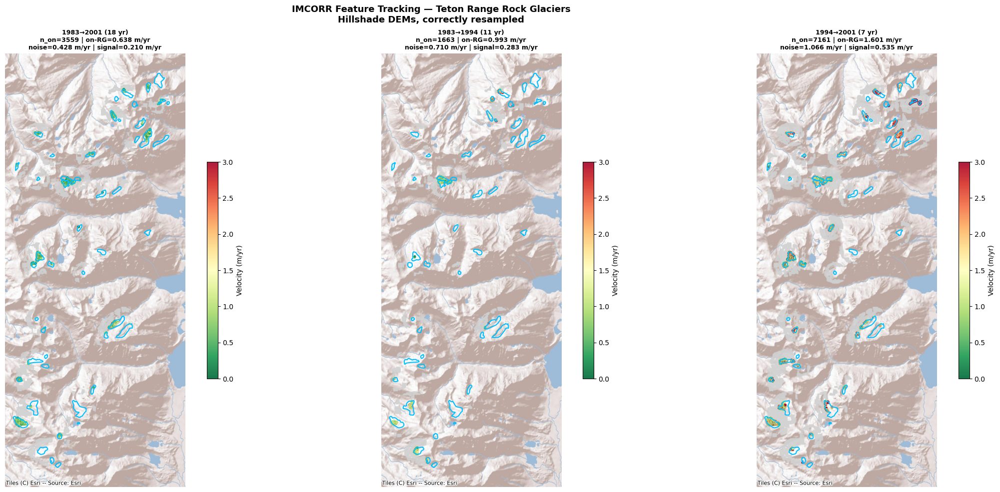

In [3]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import Point, box
from pathlib import Path

base = Path('/Users/milliespencer/Desktop/JobApps2026/NSF2026 dan rock glaciers/OneDrive_1_9-16-2026')
out_dir = Path('/Users/milliespencer/WUS_rock_glaciers/teton_imcorr')

gdf_rg = gpd.read_file('/Users/milliespencer/Downloads/PSU_ARGI/PSU_ARGI.shp').to_crs('EPSG:32612')

pairs = {
    '1983→2001 (18 yr)': (base / '1983-0~2.SHP', 18),
    '1983→1994 (11 yr)': (base / '1983-0~4.SHP', 11),
    '1994→2001 (7 yr)':  (base / '1994-0~2.SHP', 7),
}

MIN_STRENGTH = 3.0
MAX_V = 5.0
MIN_V = 0.05

fig, axes = plt.subplots(1, 3, figsize=(24, 10))
all_data = {}

for ax, (label, (path, dt)) in zip(axes, pairs.items()):
    gdf = gpd.read_file(path)
    gdf['v_myr'] = gdf['DISP_REAL'] / dt
    gdf['start'] = gdf.geometry.apply(lambda g: Point(g.coords[0][:2]))

    gdf_filt = gdf[(gdf['STRENGTH'] >= MIN_STRENGTH) &
                   (gdf['v_myr'] <= MAX_V) &
                   (gdf['v_myr'] >= MIN_V) &
                   (gdf['FLAG'] == 1)].copy()
    gdf_filt['geometry'] = gdf_filt['start']
    gdf_pts = gpd.GeoDataFrame(gdf_filt, crs='EPSG:32612')

    rgs_in = gdf_rg[gdf_rg.intersects(box(*gdf_pts.total_bounds))]
    on_rg = gpd.sjoin(gdf_pts, rgs_in[['geometry']], how='inner', predicate='within')
    off_rg = gdf_pts[~gdf_pts.index.isin(on_rg.index)]
    all_data[label] = (gdf_pts, on_rg, off_rg, rgs_in, dt)

    # Plot
    gdf_web = gdf_pts.to_crs('EPSG:3857')
    on_web = on_rg.to_crs('EPSG:3857')
    off_web = off_rg.to_crs('EPSG:3857')

    ax.scatter(off_web.geometry.x, off_web.geometry.y,
               c='lightgrey', s=1, alpha=0.2, zorder=3)
    sc = ax.scatter(on_web.geometry.x, on_web.geometry.y,
                    c=on_web['v_myr'], cmap='RdYlGn_r',
                    s=6, alpha=0.9, vmin=0, vmax=3, zorder=4)
    plt.colorbar(sc, ax=ax, label='Velocity (m/yr)', shrink=0.5)

    rgs_in.to_crs('EPSG:3857').plot(ax=ax, facecolor='none',
                                     edgecolor='deepskyblue', linewidth=1.5, zorder=5)

    ctx.add_basemap(ax, source=ctx.providers.Esri.WorldShadedRelief, zoom=13)

    signal = on_rg['v_myr'].median() - off_rg['v_myr'].median()
    ax.set_title(f'{label}\nn_on={len(on_rg)} | on-RG={on_rg["v_myr"].median():.3f} m/yr\n'
                 f'noise={off_rg["v_myr"].median():.3f} m/yr | signal={signal:.3f} m/yr',
                 fontsize=9, fontweight='bold')
    ax.set_axis_off()

plt.suptitle('IMCORR Feature Tracking — Teton Range Rock Glaciers\nHillshade DEMs, correctly resampled',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(out_dir / 'imcorr_corrected_results.png', dpi=200, bbox_inches='tight')
plt.show()

In [4]:
# Use 1994→2001 as it has the best signal
gdf_pts, on_rg, off_rg, rgs_in, dt = all_data['1994→2001 (7 yr)']

# Per rock glacier stats
rg_stats = []
for idx, row in rgs_in.iterrows():
    vecs = gpd.sjoin(gdf_pts, gpd.GeoDataFrame([row], crs='EPSG:32612'),
                     how='inner', predicate='within')
    if len(vecs) >= 5:
        rg_stats.append({
            'rg_idx':    idx,
            'n':         len(vecs),
            'v_median':  vecs['v_myr'].median(),
            'v_std':     vecs['v_myr'].std(),
            'rg_class':  row['RG_CLASS'],
            'area_km2':  row['AREA_KM2'],
        })

df_stats = gpd.GeoDataFrame(
    rg_stats,
    geometry=[rgs_in.loc[r['rg_idx']].geometry for r in rg_stats],
    crs='EPSG:32612'
)

# Signal = on-RG median vs global off-RG noise floor
noise = off_rg['v_myr'].median()
df_stats['signal'] = df_stats['v_median'] - noise
df_stats = df_stats.sort_values('signal', ascending=False)

print(f"Off-RG noise floor: {noise:.3f} m/yr")
print(f"\nTop 10 rock glaciers by signal above noise (1994→2001):")
print(df_stats[['rg_idx','rg_class','area_km2','n','v_median','signal']].head(10).to_string(index=False))

Off-RG noise floor: 1.066 m/yr

Top 10 rock glaciers by signal above noise (1994→2001):
 rg_idx  rg_class  area_km2   n  v_median   signal
   9556       2.0  0.096007   5  4.005752 2.939973
   9553       1.0  0.025272  46  3.087237 2.021458
   9555       1.0  0.062229 180  2.932077 1.866298
   9563       1.0  0.171966 163  2.710673 1.644895
   9547       1.0  0.223793 139  2.541353 1.475574
   9470       1.0  0.077300 211  2.490853 1.425074
   9465       1.0  0.411056  16  2.428261 1.362482
   9536       1.0  0.219673  13  2.199596 1.133817
   9565       1.0  0.127407 141  2.130536 1.064757
   9542       1.0  0.465590 602  2.083260 1.017481


9 out of 10 are Class 1 active, and signals range from 1.0 to 2.9 m/yr above noise. Zooming into the top 5 with enough vectors to be meaningful (n≥100): 9555, 9563, 9547, 9470, 9542

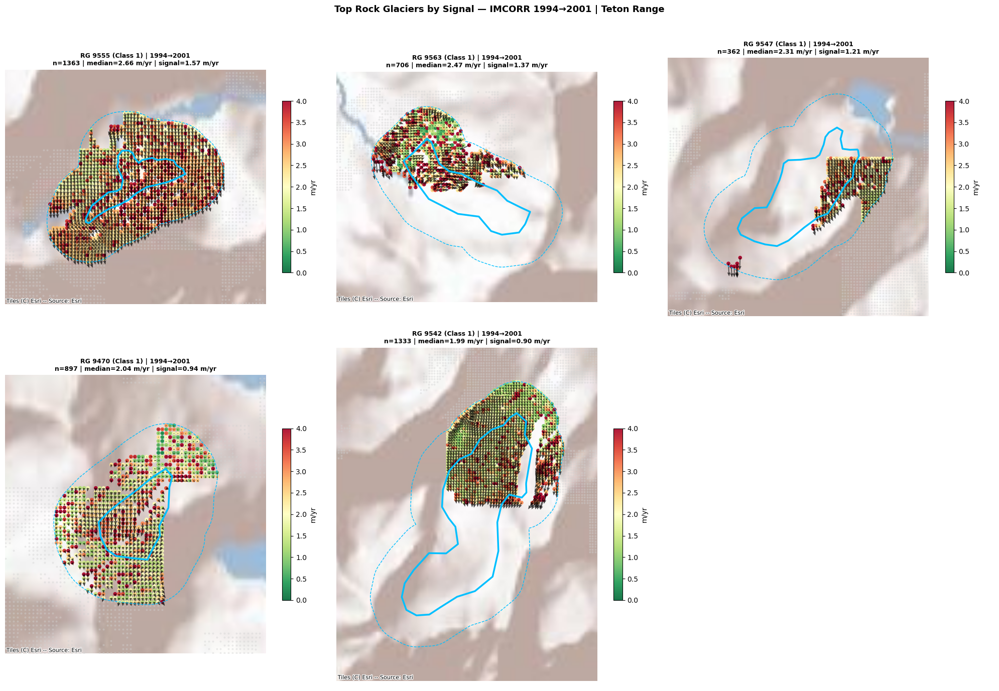

In [5]:
top_rgs = [9555, 9563, 9547, 9470, 9542]

fig, axes = plt.subplots(2, 3, figsize=(20, 14))
axes = axes.flatten()

for ax, rg_idx in zip(axes, top_rgs):
    rg_row = rgs_in.loc[rg_idx]
    gdf_single = gpd.GeoDataFrame([rg_row], crs='EPSG:32612')
    gdf_single_buf = gdf_single.copy()
    gdf_single_buf['geometry'] = gdf_single.buffer(200)

    on = gpd.sjoin(gdf_pts, gdf_single_buf[['geometry']], how='inner', predicate='within')
    off = gdf_pts[~gdf_pts.index.isin(on.index)]

    minx, miny, maxx, maxy = gdf_single_buf.to_crs('EPSG:3857').total_bounds
    buf = 300

    on_web = on.to_crs('EPSG:3857')
    off_web = off.to_crs('EPSG:3857')

    # Clip off-RG to local area for context
    off_local = off_web.cx[minx-buf:maxx+buf, miny-buf:maxy+buf]

    ax.scatter(off_local.geometry.x, off_local.geometry.y,
               c='lightgrey', s=4, alpha=0.3, zorder=3)
    sc = ax.scatter(on_web.geometry.x, on_web.geometry.y,
                    c=on_web['v_myr'], cmap='RdYlGn_r',
                    s=20, alpha=0.9, vmin=0, vmax=4, zorder=4)
    plt.colorbar(sc, ax=ax, label='m/yr', shrink=0.5)

    ax.quiver(on_web.geometry.x, on_web.geometry.y,
              on_web['XDISP'] / dt, on_web['YDISP'] / dt,
              scale=100, width=0.003, color='black',
              alpha=0.7, zorder=5, headwidth=4)

    gdf_single.to_crs('EPSG:3857').plot(ax=ax, facecolor='none',
                                         edgecolor='deepskyblue', linewidth=2.5, zorder=6)
    gdf_single_buf.to_crs('EPSG:3857').plot(ax=ax, facecolor='none',
                                              edgecolor='deepskyblue', linewidth=1,
                                              linestyle='--', zorder=6)

    ctx.add_basemap(ax, source=ctx.providers.Esri.WorldShadedRelief, zoom=13)
    ax.set_xlim(minx - buf, maxx + buf)
    ax.set_ylim(miny - buf, maxy + buf)

    signal = on['v_myr'].median() - off['v_myr'].median()
    ax.set_title(f'RG {rg_idx} (Class {int(rg_row["RG_CLASS"])}) | 1994→2001\n'
                 f'n={len(on)} | median={on["v_myr"].median():.2f} m/yr | signal={signal:.2f} m/yr',
                 fontsize=9, fontweight='bold')
    ax.set_axis_off()

# Hide unused panel
axes[-1].set_axis_off()

plt.suptitle('Top Rock Glaciers by Signal — IMCORR 1994→2001 | Teton Range',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(out_dir / 'imcorr_top_rgs_1994_2001.png', dpi=200, bbox_inches='tight')
plt.show()

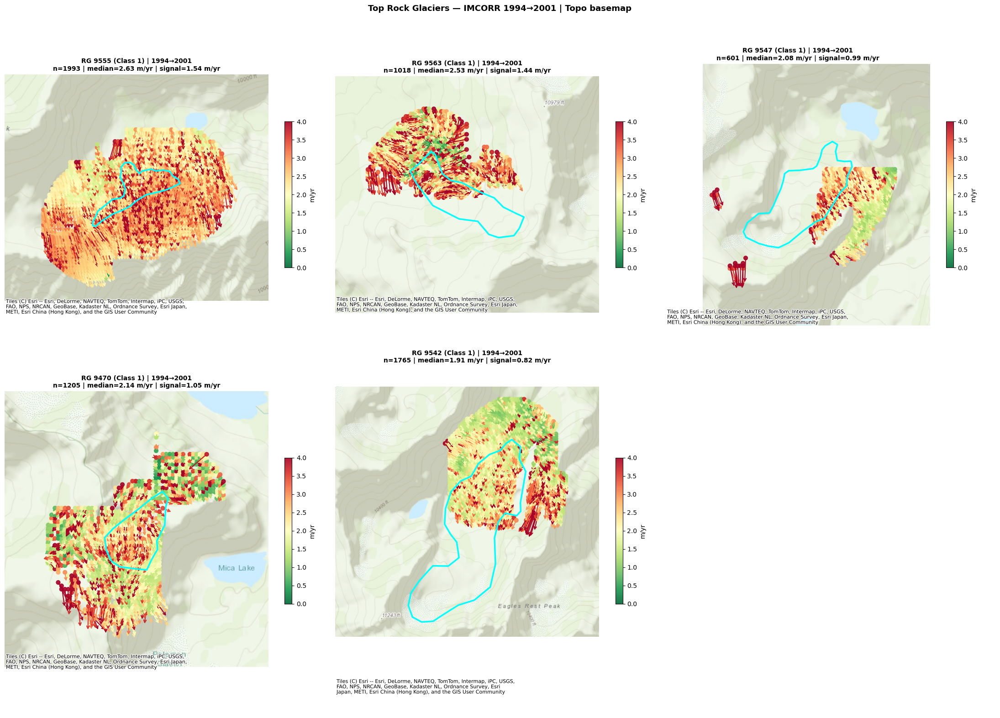

In [9]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as ctx
from pathlib import Path
from rasterio.windows import from_bounds

out_dir = Path('/Users/milliespencer/WUS_rock_glaciers/teton_imcorr')

top_rgs = [9555, 9563, 9547, 9470, 9542]

fig, axes = plt.subplots(2, 3, figsize=(22, 16))
axes = axes.flatten()

for ax, rg_idx in zip(axes, top_rgs):
    rg_row = rgs_in.loc[rg_idx]
    gdf_single = gpd.GeoDataFrame([rg_row], crs='EPSG:32612')
    gdf_single_buf = gdf_single.copy()
    gdf_single_buf['geometry'] = gdf_single.buffer(300)

    on = gpd.sjoin(gdf_pts, gdf_single_buf[['geometry']], how='inner', predicate='within')

    minx, miny, maxx, maxy = gdf_single_buf.to_crs('EPSG:3857').total_bounds
    buf = 300

    on_web = on.to_crs('EPSG:3857')

    # Velocity colored scatter
    sc = ax.scatter(on_web.geometry.x, on_web.geometry.y,
                    c=on_web['v_myr'], cmap='RdYlGn_r',
                    s=40, alpha=0.9, vmin=0, vmax=4, zorder=4)
    plt.colorbar(sc, ax=ax, label='m/yr', shrink=0.4)

    # Arrows colored by velocity
    cmap = plt.cm.RdYlGn_r
    norm = plt.Normalize(vmin=0, vmax=4)
    colors = cmap(norm(on_web['v_myr'].values))

    for i, row in on_web.iterrows():
        ax.annotate('', 
                    xy=(row.geometry.x + row['XDISP']/dt * 50,
                        row.geometry.y + row['YDISP']/dt * 50),
                    xytext=(row.geometry.x, row.geometry.y),
                    arrowprops=dict(arrowstyle='->', color=cmap(norm(row['v_myr'])),
                                   lw=1.5),
                    zorder=5)

    gdf_single.to_crs('EPSG:3857').plot(ax=ax, facecolor='none',
                                         edgecolor='cyan', linewidth=2.5, zorder=6)

    ctx.add_basemap(ax, source=ctx.providers.Esri.WorldTopoMap, zoom=15)
    ax.set_xlim(minx - buf, maxx + buf)
    ax.set_ylim(miny - buf, maxy + buf)

    signal = on['v_myr'].median() - off['v_myr'].median()
    ax.set_title(f'RG {rg_idx} (Class {int(rg_row["RG_CLASS"])}) | 1994→2001\n'
                 f'n={len(on)} | median={on["v_myr"].median():.2f} m/yr | signal={signal:.2f} m/yr',
                 fontsize=10, fontweight='bold')
    ax.set_axis_off()

axes[-1].set_axis_off()

plt.suptitle('Top Rock Glaciers — IMCORR 1994→2001 | Topo basemap',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(out_dir / 'imcorr_top_rgs_topo.png', dpi=200, bbox_inches='tight')
plt.show()